# Ross Sea synthetic gravity inversion

import packages

In [1]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2

import copy
import logging
import os
import pathlib
import pickle
import string

import numpy as np
import pandas as pd
import scipy as sp
import verde as vd
import xarray as xr
from polartoolkit import maps, profiles
from polartoolkit import utils as polar_utils

import RIS_gravity_inversion.plotting as RIS_plotting
import RIS_gravity_inversion.synthetic as RIS_synth

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

from invert4geom import (
    inversion,
    optimization,
    plotting,
    regional,
    synthetic,
    uncertainty,
    utils,
)

# Get synthetic model data

INFO:root:using preprocessed 5km grid since spacing is > 5km
INFO:root:returning grid with new region and/or registration, same spacing
INFO:root:returning grid with new region and/or registration, same spacing


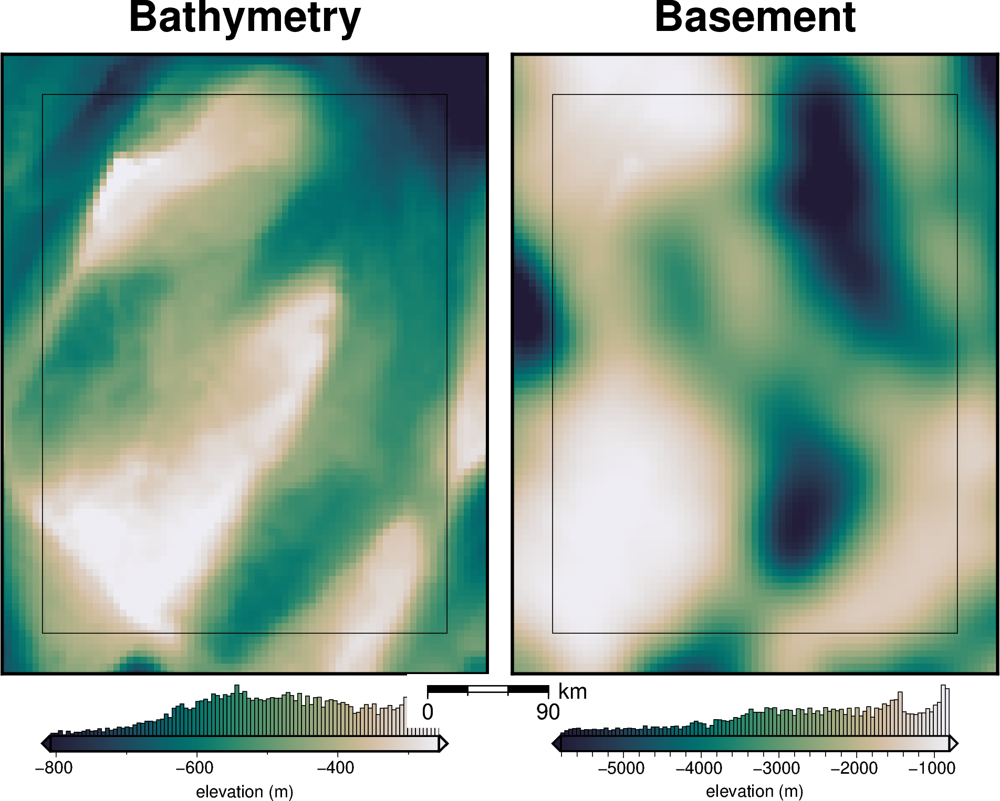

  0%|          | 0/4941 [00:00<?, ?it/s]

  0%|          | 0/4941 [00:00<?, ?it/s]

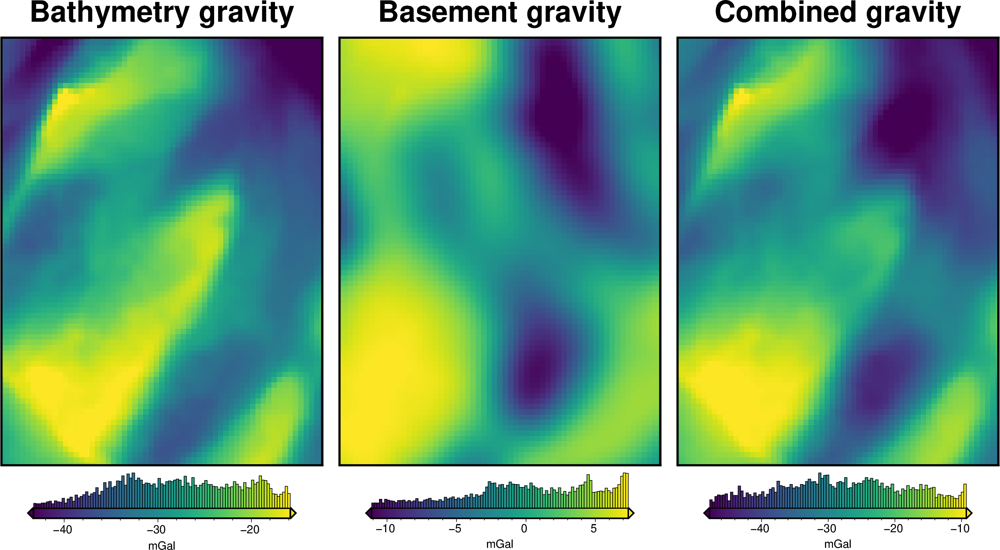

,northing,easting,upward,bathymetry_grav,basement_grav,disturbance,gravity_anomaly
0,-1800000.0,-40000.0,1000.0,-28.046289,5.902989,-22.143300,-22.143300
1,-1800000.0,-35000.0,1000.0,-26.714502,6.290602,-20.423900,-20.423900
2,-1800000.0,-30000.0,1000.0,-25.919276,6.607112,-19.312163,-19.312163
3,-1800000.0,-25000.0,1000.0,-25.236960,6.851960,-18.385001,-18.385001
4,-1800000.0,-20000.0,1000.0,-24.610928,7.009259,-17.601670,-17.601670


In [2]:
# set grid parameters
spacing = 5e3
inversion_region = (-40e3, 260e3, -1800e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, grav_df = RIS_synth.load_synthetic_model(
    spacing=spacing,
    buffer=spacing * 6,
    basement=True,
    # gravity_noise=.3,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]
grav_df.head()

In [3]:
reg = grav_df.basement_grav
reg -= reg.mean()
utils.rmse(reg)

np.float64(5.0842773757391)

In [4]:
# normalize regional gravity between -1 and 1
grav_df["basement_grav_normalized"] = (
    vd.grid_to_table(
        utils.normalize_xarray(
            grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav,
            low=-1,
            high=1,
        )
    )
    .reset_index()
    .basement_grav
)
grav_df = grav_df.drop(columns=["basement_grav", "disturbance", "gravity_anomaly"])

In [ ]:
# re-scale the regional gravity
regional_grav = utils.normalize_xarray(
    grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav_normalized,
    low=0,
    high=20,
).rename("basement_grav")
regional_grav -= regional_grav.mean()

# add to dataframe
grav_df["basement_grav"] = vd.grid_to_table(regional_grav).reset_index().basement_grav

# add basement and bathymetry forward gravities together to make observed gravity
grav_df["gravity_anomaly_full_res_no_noise"] = (
    grav_df.bathymetry_grav + grav_df.basement_grav
)

# add noise to the gravity anomaly
grav_df["gravity_anomaly_full_res"] = grav_df.gravity_anomaly_full_res_no_noise
cont = synthetic.contaminate_with_long_wavelength_noise(
    grav_df.set_index(["northing", "easting"])
    .to_xarray()
    .gravity_anomaly_full_res_no_noise,
    coarsen_factor=None,
    spacing=50e3,
    noise_as_percent=False,
    noise=0.3,
)
df = vd.grid_to_table(cont.rename("gravity_anomaly_full_res")).reset_index(drop=True)
grav_df = pd.merge(  # noqa: PD015
    grav_df.drop(columns=["gravity_anomaly_full_res"], errors="ignore"),
    df,
    on=["easting", "northing"],
)

grav_df["gravity_anomaly_full_res"], stddev = synthetic.contaminate(
    grav_df.gravity_anomaly_full_res, stddev=0.3, percent=False, seed=0
)
grav_df["uncert"] = 0.3

new_reg = grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav
new_reg -= new_reg.mean()
print(utils.rmse(new_reg))

grav_df

INFO:invert4geom:Standard deviation used for noise: [0.3]
INFO:invert4geom:Standard deviation used for noise: [0.3]


4.918110536633229


,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-22.417501,0.3
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-20.803706,0.3
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-19.488174,0.3
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-18.748448,0.3
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-18.181498,0.3
...,...,...,...,...,...,...,...,...,...
4936,-1400000.0,240000.0,1000.0,-48.323584,0.243973,-0.151982,-48.475566,-47.841659,0.3
4937,-1400000.0,245000.0,1000.0,-48.356131,0.167427,-0.917439,-49.273571,-49.416021,0.3
4938,-1400000.0,250000.0,1000.0,-49.079005,0.076264,-1.829069,-50.908074,-50.280223,0.3
4939,-1400000.0,255000.0,1000.0,-49.877171,-0.022265,-2.814361,-52.691532,-52.909670,0.3


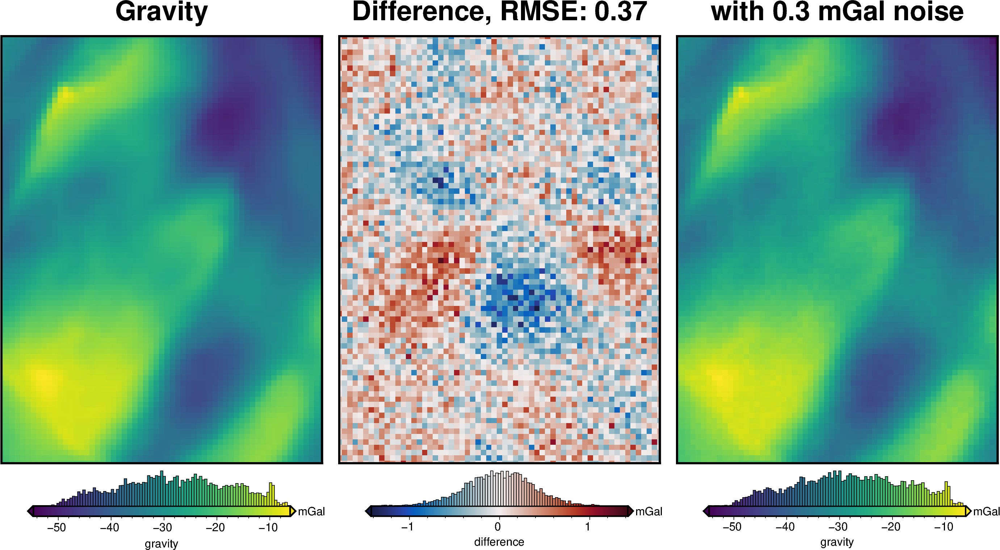

In [7]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

_ = polar_utils.grd_compare(
    grav_grid.gravity_anomaly_full_res_no_noise,
    grav_grid.gravity_anomaly_full_res,
    fig_height=10,
    plot=True,
    plot_type="pygmt",
    grid1_name="Gravity",
    grid2_name="with 0.3 mGal noise",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="mGal",
    cbar_label="gravity",
    # RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    cbar_yoffset=1,
    label_font="16p,Helvetica,black",
)

## Create synthetic airborne survey

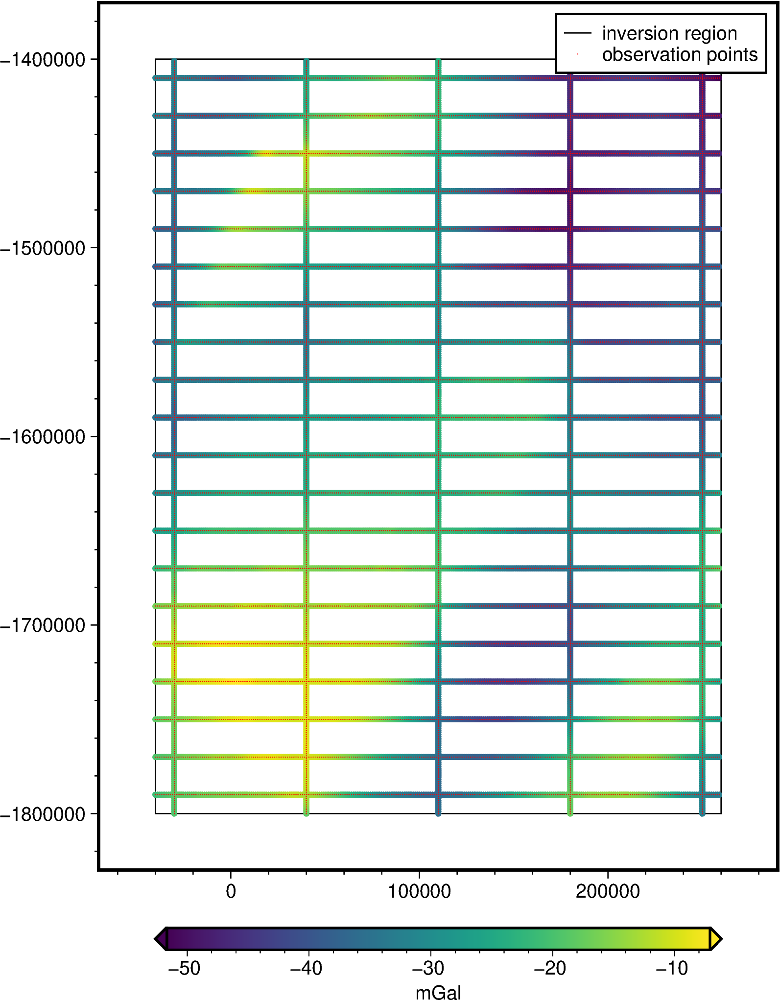

,northing,easting,upward,gravity_anomaly
0,-1800000.0,-30000.0,1000.0,-19.488174
1,-1800000.0,40000.0,1000.0,-18.312866
2,-1800000.0,110000.0,1000.0,-35.497414
3,-1800000.0,180000.0,1000.0,-17.484072
4,-1800000.0,250000.0,1000.0,-32.895409
...,...,...,...,...
5995,-1410000.0,255000.0,1000.0,-49.867092
5996,-1410000.0,256000.0,1000.0,-50.256744
5997,-1410000.0,257000.0,1000.0,-50.725707
5998,-1410000.0,258000.0,1000.0,-51.218534


In [8]:
grav_survey_df = RIS_synth.airborne_survey(
    along_line_spacing=1e3,
    grav_observation_height=1e3,
    NS_line_spacing=70e3,
    EW_line_spacing=20e3,
    region=inversion_region,
    grav_grid=grav_df.set_index(
        ["northing", "easting"]
    ).gravity_anomaly_full_res.to_xarray(),
    plot=True,
)
grav_survey_df

In [27]:
# grid the airborne survey data over the whole grid
coords = (grav_survey_df.easting, grav_survey_df.northing, grav_survey_df.upward)
data = grav_survey_df.gravity_anomaly

_, eqs = optimization.optimize_eq_source_params(
    coords,
    data,
    n_trials=12,
    damping_limits=[1e-20, 10],
    depth_limits=(
        100,
        100e3,
    ),
    # damping=None,
    # depth="default",
    block_size=spacing * 2,
    plot=True,
)

# predict sources onto grid
grav_df["eqs_gravity_anomaly"] = eqs.predict(
    (
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,  # either grav_df.upward or user-set constant value
    ),
)

grav_df["gravity_anomaly"] = grav_df.eqs_gravity_anomaly
grav_df

  0%|          | 0/12 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 4
INFO:invert4geom:	parameter: {'depth': 57156.0665071041, 'damping': 1.5369755553384883e-20}
INFO:invert4geom:	scores: [0.9994284703717031]


,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,starting_gravity,eqs_gravity_anomaly,gravity_anomaly
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-22.417501,0.3,-19.062575,-22.453228,-22.453228
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-20.803706,0.3,-18.792216,-20.452633,-20.452633
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-19.488174,0.3,-18.530713,-19.507269,-19.507269
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-18.748448,0.3,-18.281720,-19.144625,-19.144625
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-18.181498,0.3,-18.048032,-18.885928,-18.885928
...,...,...,...,...,...,...,...,...,...,...,...,...
4936,-1400000.0,240000.0,1000.0,-48.323584,0.243973,-0.151982,-48.475566,-47.841659,0.3,-45.031204,-49.159135,-49.159135
4937,-1400000.0,245000.0,1000.0,-48.356131,0.167427,-0.917439,-49.273571,-49.416021,0.3,-45.622814,-49.644093,-49.644093
4938,-1400000.0,250000.0,1000.0,-49.079005,0.076264,-1.829069,-50.908074,-50.280223,0.3,-46.166463,-50.340857,-50.340857
4939,-1400000.0,255000.0,1000.0,-49.877171,-0.022265,-2.814361,-52.691532,-52.909670,0.3,-46.660815,-51.730957,-51.730957


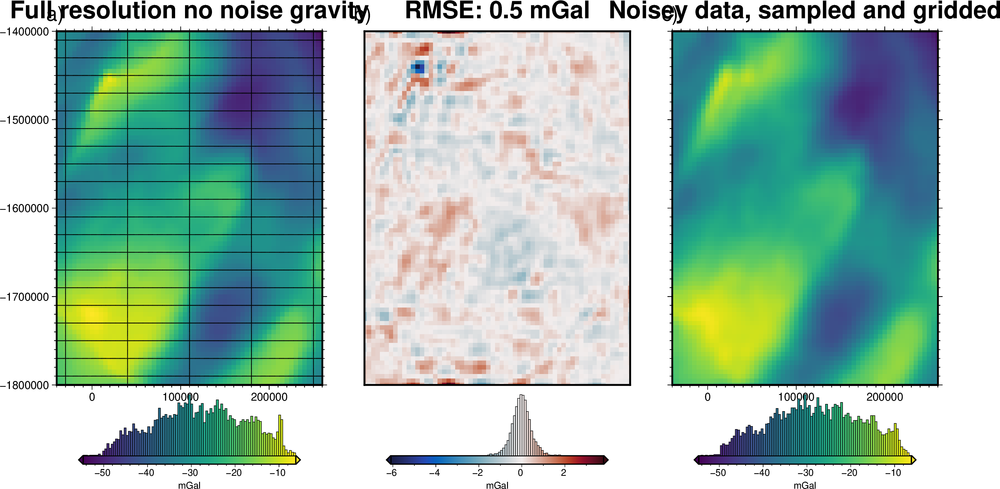

In [29]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

# plot the synthetic gravity anomaly grid
lims = polar_utils.get_min_max(grav_grid.gravity_anomaly_full_res_no_noise)

fig = maps.plot_grd(
    grav_grid.gravity_anomaly_full_res_no_noise,
    fig_height=10,
    cmap="viridis",
    cpt_lims=lims,
    title="Full resolution no noise gravity",
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
)
# plot observation points
fig.plot(
    grav_survey_df[["easting", "northing"]],
    style="c.02c",
    fill="black",
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

dif = grav_grid.gravity_anomaly_full_res_no_noise - grav_grid.gravity_anomaly
fig = maps.plot_grd(
    dif,
    fig_height=10,
    cmap="balance+h0",
    title=f"RMSE: {round(utils.rmse(dif),2)} mGal",
    cbar_label="mGal",
    hist=True,
    cbar_yoffset=2,
    grd2_cpt=True,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)

# plot the synthetic observed gravity grid
fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    fig_height=10,
    cmap="viridis",
    cpt_lims=lims,
    title="Noisey data, sampled and gridded",
    cbar_label="mGal",
    frame=["nSwe", "xaf10000", "yaf10000"],
    hist=True,
    cbar_yoffset=2,
    fig=fig,
    origin_shift="xshift",
    xshift_amount=1.1,
)
fig.text(
    position="TL",
    justify="BL",
    text="c)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.show()

# Make starting bathymetry model

In [30]:
# semi-regularly spaced
constraint_points = RIS_synth.constraint_layout_number(
    shape=(4, 5),
    region=inversion_region,
    padding=-spacing,
)

# sample true topography at these points
constraint_points = utils.sample_grids(
    constraint_points,
    bathymetry,
    "true_upward",
    coord_names=("easting", "northing"),
)
constraint_points["upward"] = constraint_points.true_upward
constraint_points.head()

,northing,easting,true_upward,upward
0,-1756000.0,1250.0,-277.117397,-277.117397
1,-1756000.0,73750.0,-292.754172,-292.754172
2,-1756000.0,146250.0,-587.490438,-587.490438
3,-1756000.0,218750.0,-303.910608,-303.910608
4,-1678000.0,1250.0,-356.930926,-356.930926


In [31]:
# re-sample depths with uncertainty to emulate measurement errors
# set each points uncertainty equal to 5% of depth
uncert = np.abs(0.05 * constraint_points.upward)
constraint_points.loc[constraint_points.index, "true_uncert"] = uncert

constraint_points = uncertainty.randomly_sample_data(
    seed=0,
    data_df=constraint_points,
    data_col="upward",
    uncert_col="true_uncert",
)

# create weights column
constraint_points["weight"] = 1 / (constraint_points.true_uncert**2)

constraint_points.head()

,northing,easting,true_upward,upward,true_uncert,weight
0,-1756000.0,1250.0,-277.117397,-275.375295,13.855870,0.005209
1,-1756000.0,73750.0,-292.754172,-294.687884,14.637709,0.004667
2,-1756000.0,146250.0,-587.490438,-568.678329,29.374522,0.001159
3,-1756000.0,218750.0,-303.910608,-302.316595,15.195530,0.004331
4,-1678000.0,1250.0,-356.930926,-366.490774,17.846546,0.003140


In [32]:
# grid the sampled values using verde
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    constraints_df=constraint_points,
    dampings=None,
)

starting_bathymetry = utils.create_topography(**starting_topography_kwargs)

starting_bathymetry

<xarray.DataArray 'scalars' (northing: 93, easting: 73)> Size: 54kB
array([[-303.24475574, -298.17670114, -293.309081  , ..., -141.38005887,
        -137.601561  , -134.26376675],
       [-306.36095693, -301.17407494, -296.18418998, ..., -146.10221978,
        -142.49600468, -139.33518106],
       [-309.55275108, -304.24244944, -299.12514901, ..., -150.95475306,
        -147.54398876, -144.57979728],
       ...,
       [-926.46439054, -915.53324124, -904.29780712, ..., -760.25661438,
        -766.95359347, -773.34054824],
       [-933.74127475, -922.61035891, -911.16790173, ..., -762.49954932,
        -769.32269313, -775.84002087],
       [-940.91296772, -929.59751638, -917.96743203, ..., -764.95391321,
        -771.88330366, -778.51304949]])
Coordinates:
  * easting   (easting) float64 584B -7e+04 -6.5e+04 -6e+04 ... 2.85e+05 2.9e+05
  * northing  (northing) float64 744B -1.83e+06 -1.825e+06 ... -1.37e+06
Attributes:
    metadata:  Generated by SplineCV(cv=KFold(n_splits=5, random_state=0, shu...
    damping:   None

In [33]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    starting_bathymetry,
    "starting_bathymetry",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.true_upward - constraint_points.starting_bathymetry)
print(f"RMSE: {rmse:.2f} m")

RMSE: 20.25 m


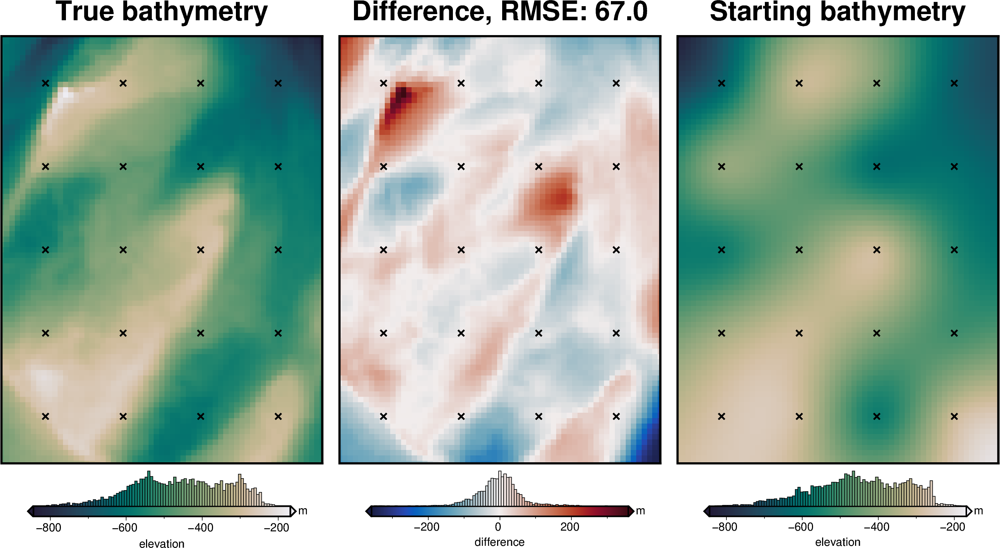

In [34]:
# compare starting and actual bathymetry grids
grids = polar_utils.grd_compare(
    bathymetry,
    starting_bathymetry,
    fig_height=10,
    plot=True,
    plot_type="pygmt",
    cmap="rain",
    reverse_cpt=True,
    diff_cmap="balance+h0",
    grid1_name="True bathymetry",
    grid2_name="Starting bathymetry",
    title="Difference",
    title_font="18p,Helvetica-Bold,black",
    cbar_unit="m",
    cbar_label="elevation",
    RMSE_decimals=0,
    region=inversion_region,
    inset=False,
    hist=True,
    cbar_yoffset=1,
    label_font="16p,Helvetica,black",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)

In [35]:
# the true density contrast is 1476 kg/m3
density_contrast = 1350

# set the reference level from the prisms to 0
zref = 0

density_grid = xr.where(
    starting_bathymetry >= zref,
    density_contrast,
    -density_contrast,
)

# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)

grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/4941 [00:00<?, ?it/s]

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,starting_gravity,eqs_gravity_anomaly,gravity_anomaly
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-22.417501,0.3,-16.181583,-22.453228,-22.453228
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-20.803706,0.3,-15.952084,-20.452633,-20.452633
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-19.488174,0.3,-15.730103,-19.507269,-19.507269
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-18.748448,0.3,-15.518741,-19.144625,-19.144625
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-18.181498,0.3,-15.320371,-18.885928,-18.885928
...,...,...,...,...,...,...,...,...,...,...,...,...
4936,-1400000.0,240000.0,1000.0,-48.323584,0.243973,-0.151982,-48.475566,-47.841659,0.3,-38.225484,-49.159135,-49.159135
4937,-1400000.0,245000.0,1000.0,-48.356131,0.167427,-0.917439,-49.273571,-49.416021,0.3,-38.727682,-49.644093,-49.644093
4938,-1400000.0,250000.0,1000.0,-49.079005,0.076264,-1.829069,-50.908074,-50.280223,0.3,-39.189167,-50.340857,-50.340857
4939,-1400000.0,255000.0,1000.0,-49.877171,-0.022265,-2.814361,-52.691532,-52.909670,0.3,-39.608807,-51.730957,-51.730957


## Regional misfit

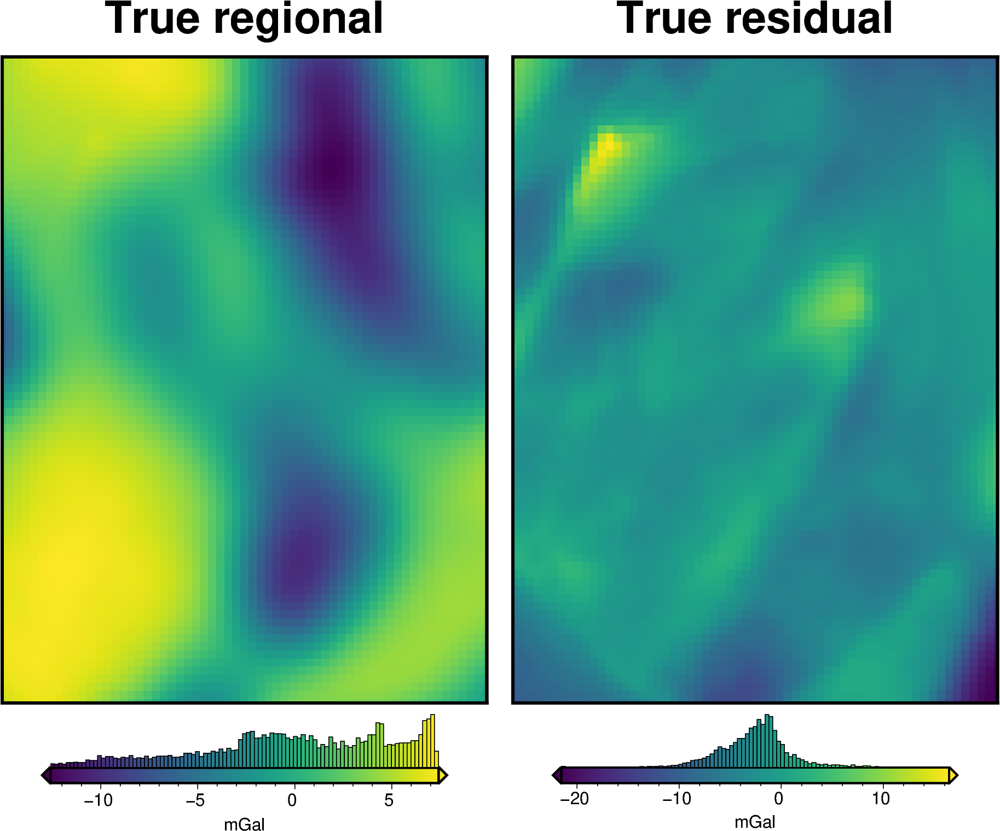

In [37]:
# calculate the true residual misfit
grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity

# grid the results
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.basement_grav,
    fig_height=10,
    title="True regional",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
)

fig = maps.plot_grd(
    grav_grid.true_res,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="True residual",
    hist=True,
    cbar_yoffset=1,
    cbar_label="mGal",
)

fig.show()

In [39]:
def regional_comparison(df):
    # grid the results
    grav_grid = df.set_index(["northing", "easting"]).to_xarray()

    # calculate the true residual and regional misfit
    grav_grid["true_res"] = grav_grid.bathymetry_grav - grav_grid.starting_gravity
    grav_grid["true_reg"] = grav_grid.gravity_anomaly - grav_grid.bathymetry_grav

    # compare with true regional
    _ = polar_utils.grd_compare(
        grav_grid.basement_grav,
        grav_grid.starting_reg,
        plot=True,
        grid1_name="True regional misfit",
        grid2_name="Regional misfit",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )
    # compare with true residual
    _ = polar_utils.grd_compare(
        grav_grid.true_res,
        grav_grid.staring_res,
        plot=True,
        grid1_name="True residual misfit",
        grid2_name="Residual misfit",
        cmap="balance+h0",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )

In [40]:
# estimate regional with the constraints
regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    cv=True,
    cv_kwargs=dict(
        n_trials=500,
        damping_limits=(1e-30, 10),
        depth_limits=(100, 200e3),
        progressbar=False,
        fname="tmp/07_regional_sep",
    ),
    # constraints_weights_column="weight",
    block_size=None,
)

  0%|          | 0/500 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 177
INFO:invert4geom:	parameter: {'depth': 49528.59432637741, 'damping': 2.0566738885019465e-10}
INFO:invert4geom:	scores: [0.21187117609379885]


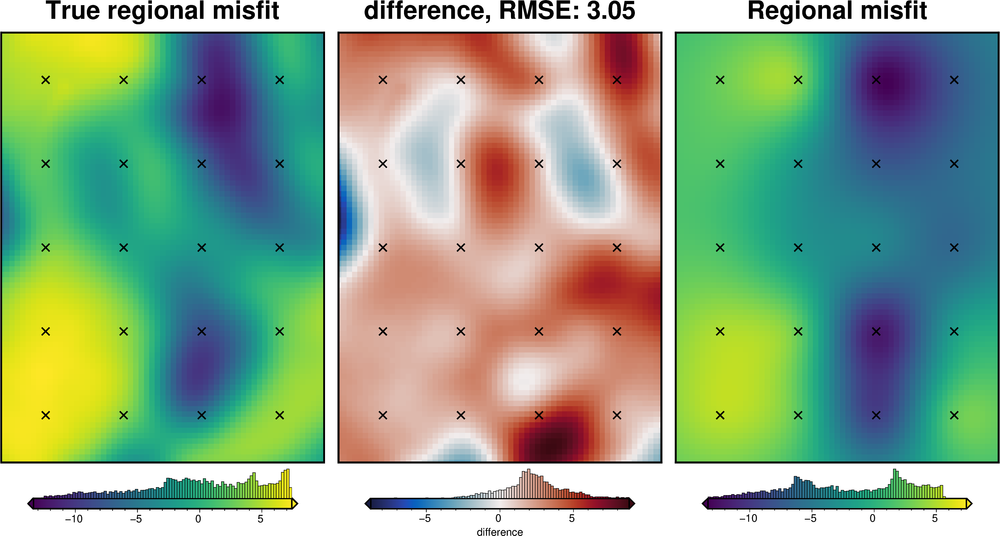

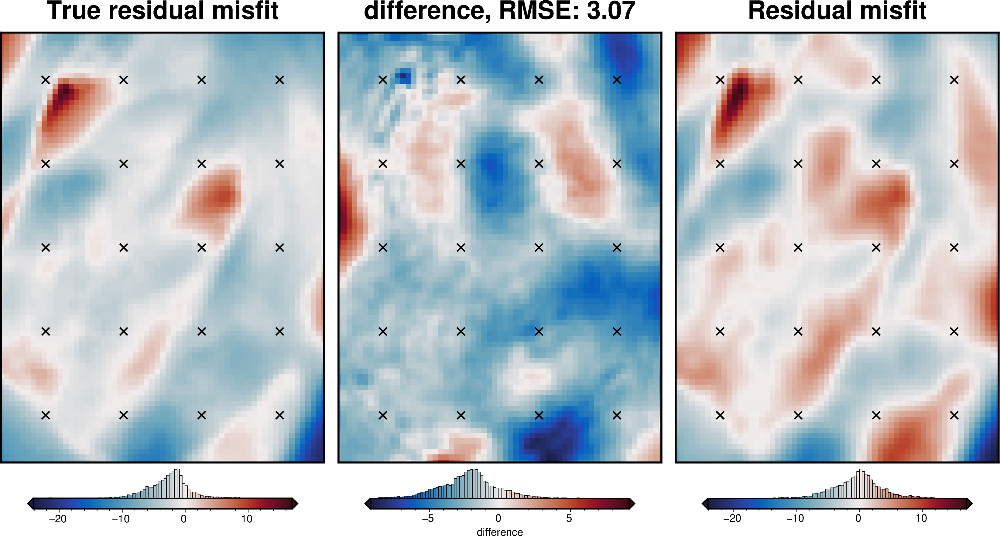

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,starting_gravity,eqs_gravity_anomaly,gravity_anomaly,true_res,misfit,reg,res,staring_res,starting_reg
count,4.941000e+03,4941.00000,4941.0,4941.000000,4941.000000,4.941000e+03,4941.000000,4941.000000,4.941000e+03,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000
mean,-1.600000e+06,110000.00000,1000.0,-28.076339,0.259171,7.362839e-16,-28.076339,-28.072748,3.000000e-01,-25.425844,-28.058026,-28.058026,-2.650495,-2.632182,-2.144123,-0.488059,-0.488059,-2.144123
std,1.169164e+05,88042.99419,0.0,7.267542,0.491861,4.918608e+00,10.294668,10.288298,5.551677e-17,6.610047,10.295847,10.295847,3.791899,6.611333,4.783040,4.352728,4.352728,4.783040
min,-1.800000e+06,-40000.00000,1000.0,-50.834525,-1.000000,-1.259171e+01,-54.678282,-54.558574,3.000000e-01,-45.631348,-54.030668,-54.030668,-21.559979,-22.502282,-13.356342,-24.091333,-24.091333,-13.356342
25%,-1.700000e+06,35000.00000,1000.0,-33.380910,-0.034308,-2.934787e+00,-35.726921,-35.779109,3.000000e-01,-29.971594,-35.784230,-35.784230,-4.572895,-7.047896,-6.028120,-2.724240,-2.724240,-6.028120
50%,-1.600000e+06,110000.00000,1000.0,-28.037682,0.288825,2.965387e-01,-28.106720,-28.066756,3.000000e-01,-25.420732,-27.966904,-27.966904,-2.348591,-2.334720,-2.059824,-0.158739,-0.158739,-2.059824
75%,-1.500000e+06,185000.00000,1000.0,-21.983838,0.677359,4.181878e+00,-20.290869,-20.186209,3.000000e-01,-20.107123,-20.225554,-20.225554,-0.832782,2.259941,2.047364,1.790200,1.790200,2.047364
max,-1.400000e+06,260000.00000,1000.0,-13.088736,1.000000,7.408290e+00,-6.187838,-6.300661,3.000000e-01,-10.550838,-6.902326,-6.902326,16.456882,20.282575,5.548144,16.940244,16.940244,5.548144


In [41]:
temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)

# temporarily set some kwargs
temp_reg_kwargs["cv_kwargs"]["plot"] = True
temp_reg_kwargs["cv_kwargs"]["progressbar"] = True

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **temp_reg_kwargs,
)

grav_df["staring_res"] = grav_df.res
grav_df["starting_reg"] = grav_df.reg

regional_comparison(grav_df)
grav_df.describe()

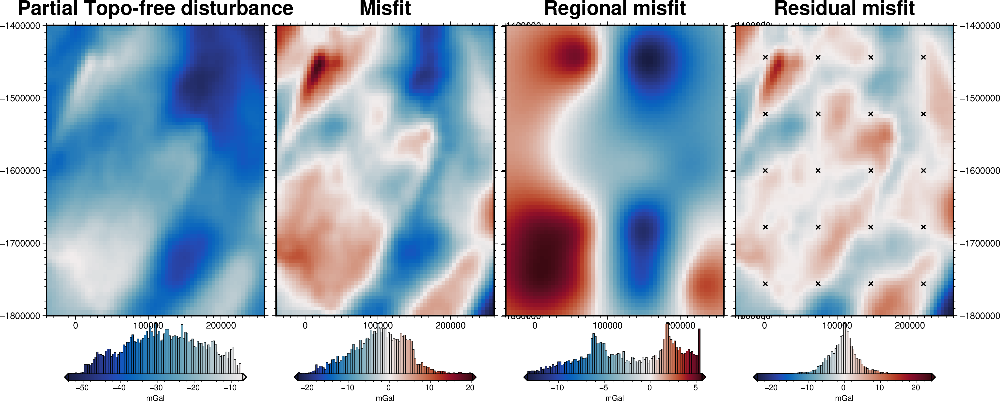

In [42]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()

fig = maps.plot_grd(
    grav_grid.gravity_anomaly,
    region=inversion_region,
    fig_height=10,
    title="Partial Topo-free disturbance",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSWe", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.misfit,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.reg,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Regional misfit",
    cmap="balance+h0",
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
)

fig = maps.plot_grd(
    grav_grid.res,
    region=inversion_region,
    fig=fig,
    origin_shift="xshift",
    fig_height=10,
    title="Residual misfit",
    cmap="balance+h0",
    cpt_lims=[-vd.maxabs(grav_grid.res), vd.maxabs(grav_grid.res)],
    hist=True,
    cbar_label="mGal",
    frame=["nSwE", "xaf10000", "yaf10000"],
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)
fig.show()

In [43]:
grav_df.uncert.mean()

np.float64(0.29999999999999993)

In [44]:
# set kwargs to pass to the inversion
kwargs = {
    # set stopping criteria
    "max_iterations": 200,
    "l2_norm_tolerance": grav_df.uncert.mean() ** 2,  # square root of the gravity noise
    "delta_l2_norm_tolerance": 1.008,
}

# Damping Cross Validation

INFO:invert4geom:saving all results with root name '../../results/Ross_Sea_07_damping_cv'
INFO:invert4geom:running damping cross validation


  0%|          | 0/8 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 2
INFO:invert4geom:	parameter: {'damping': 0.024577958705414536}
INFO:invert4geom:	scores: [0.05702666378567353]
INFO:invert4geom:results saved to ../../results/Ross_Sea_07_damping_cv_results.pickle.pickle


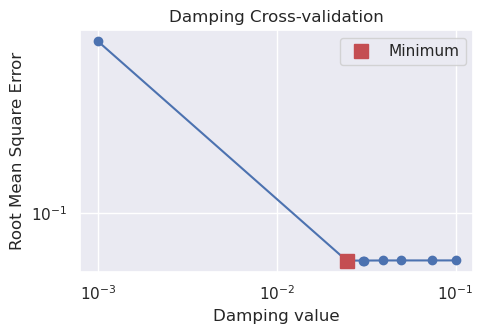

In [23]:
logging.getLogger().setLevel(logging.INFO)

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df,
    starting_prisms=starting_prisms,
    # for creating test/train splits
    grav_spacing=spacing,
    inversion_region=inversion_region,
    run_damping_cv=True,
    damping_limits=(0.001, 0.1),
    damping_cv_trials=8,
    plot_cv=True,
    fname="../../results/Ross_Sea_07_damping_cv",
    **kwargs,
)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [15]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_07_damping_cv_results.pickle").open(
    "rb"
) as f:
    results = pickle.load(f)

# load study
with pathlib.Path("../../results/Ross_Sea_07_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

In [16]:
best_damping = parameters.get("Solver damping")
best_damping

0.024577958705414536

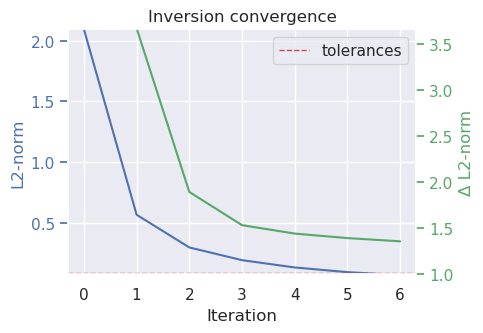

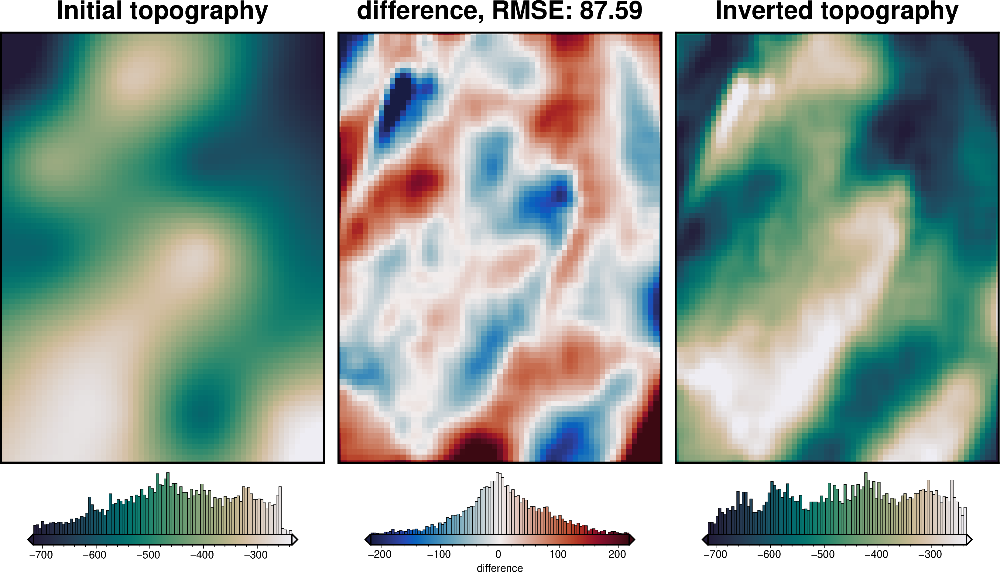

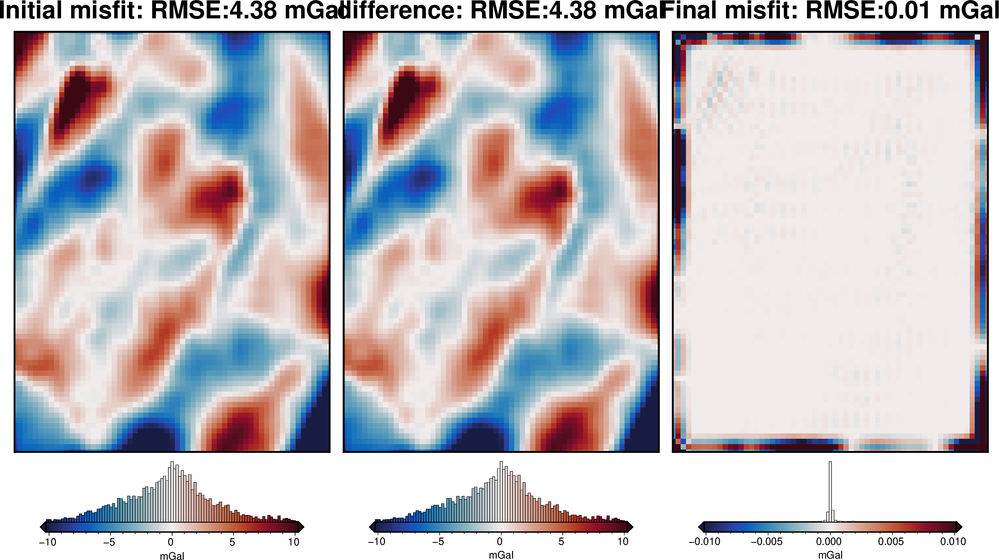

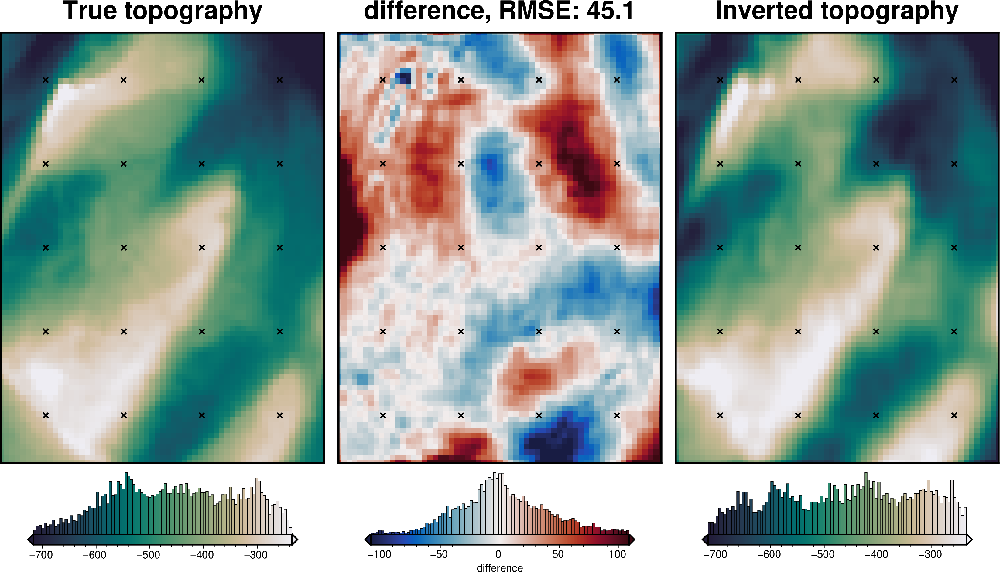

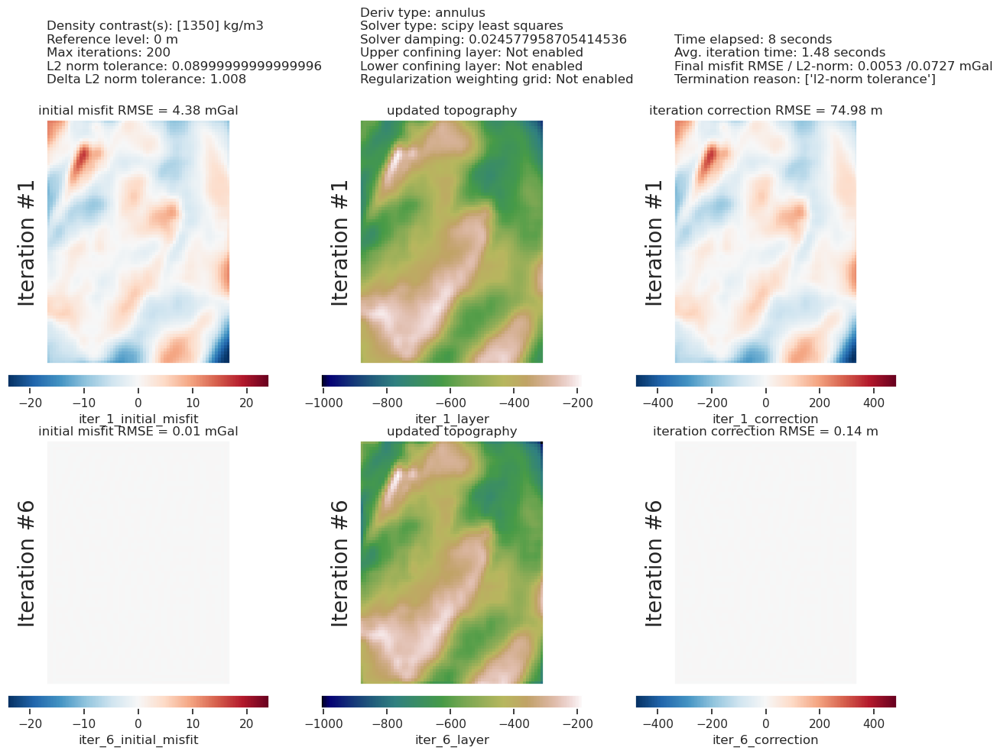

In [17]:
plotting.plot_convergence(
    grav_results,
    params=parameters,
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)

In [18]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.true_upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 21.47 m


## Density CV

INFO:invert4geom:Constraints split into 5 folds


  0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting_topography not provided, creating a starting topography model with the supplied starting_topography_kwargs
INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 9
INFO:invert4geom:	parameter: {'density_contrast': 1590.3559403649456}
INFO:invert4geom:	scores: [65.85303822036727]


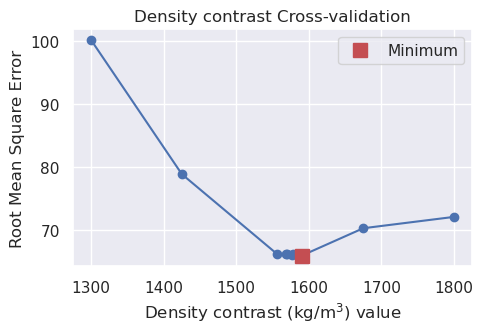

In [29]:
# run a 5-fold cross validation for 8 parameter sets of density
# this performs 40 regional separations and 40 inversions
study, inversion_results = optimization.optimize_inversion_zref_density_contrast_kfolds(
    grav_df=grav_df,
    solver_damping=best_damping,
    constraints_df=constraint_points,
    density_contrast_limits=(1300, 1800),
    zref=0,
    n_trials=10,
    split_kwargs=dict(
        n_splits=5,
        method="KFold",
    ),
    regional_grav_kwargs=regional_grav_kwargs,
    starting_topography_kwargs=starting_topography_kwargs,
    fname="../../results/Ross_Sea_07_density_cv",
    fold_progressbar=False,
    **kwargs,
)

In [19]:
# load saved inversion results
with pathlib.Path("../../results/Ross_Sea_07_density_cv_results.pickle").open(
    "rb"
) as f:
    inversion_results = pickle.load(f)

# load study
with pathlib.Path("../../results/Ross_Sea_07_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

# collect the results
topo_results, grav_results, parameters, elapsed_time = inversion_results

In [20]:
best_density_contrast = study.best_params["density_contrast"]
print("optimal determined density contrast", best_density_contrast)
print("real density contrast", true_density_contrast)

optimal determined density contrast 1590.3559403649456
real density contrast 1476


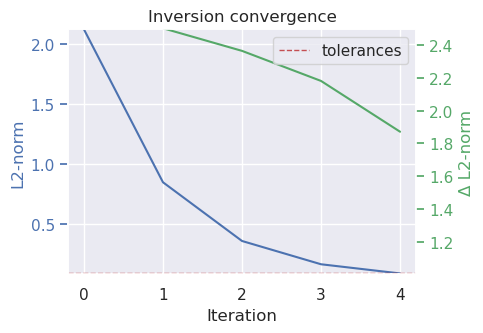

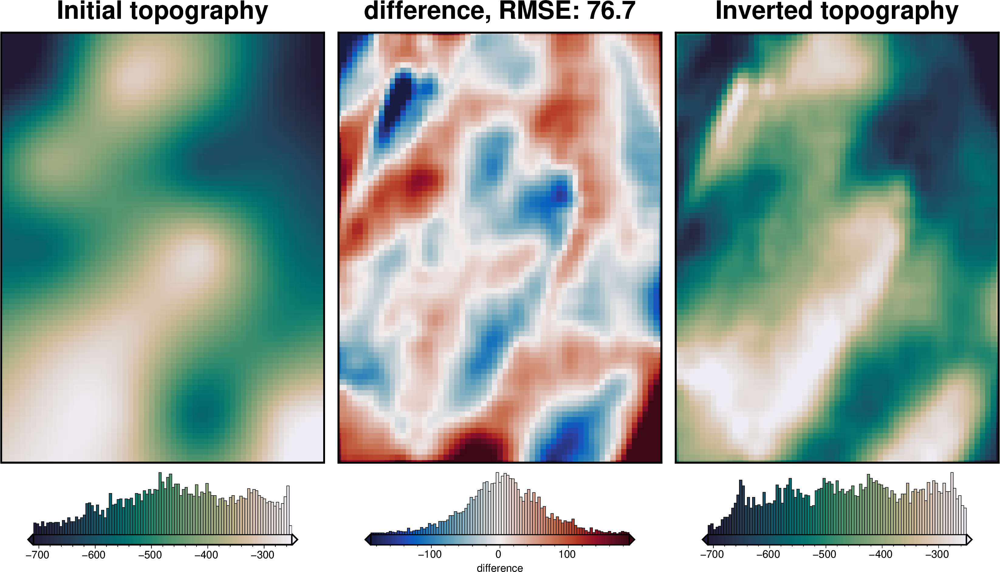

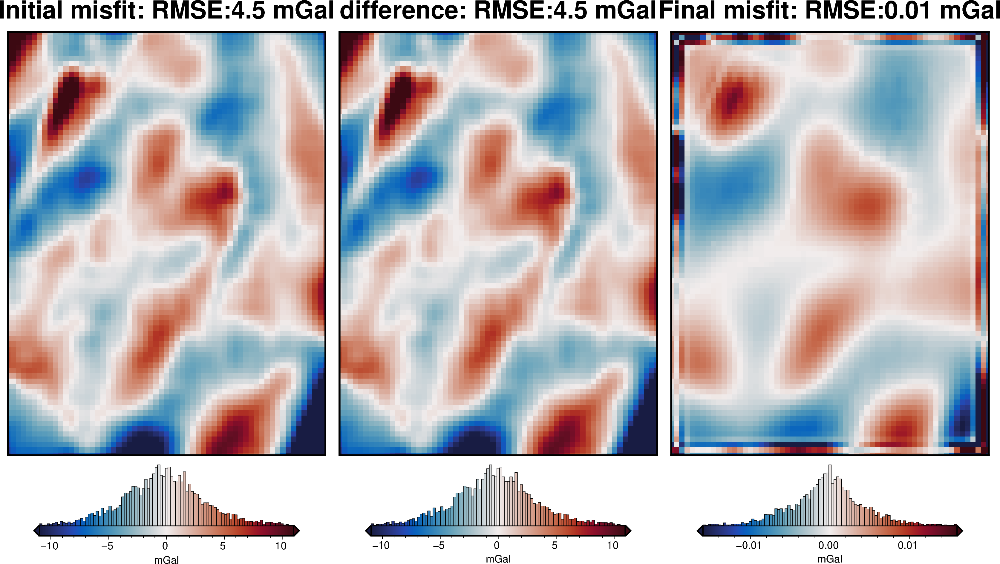

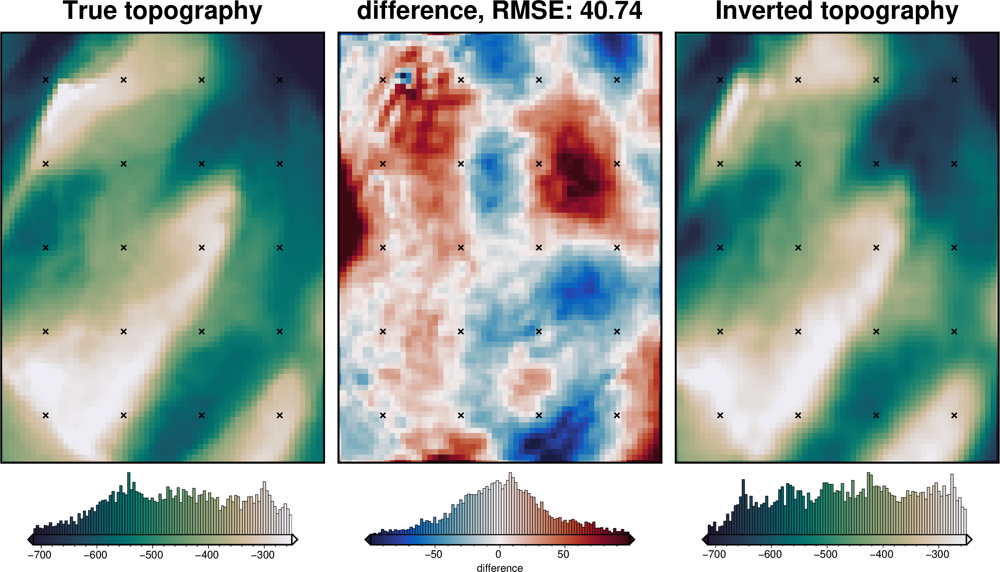

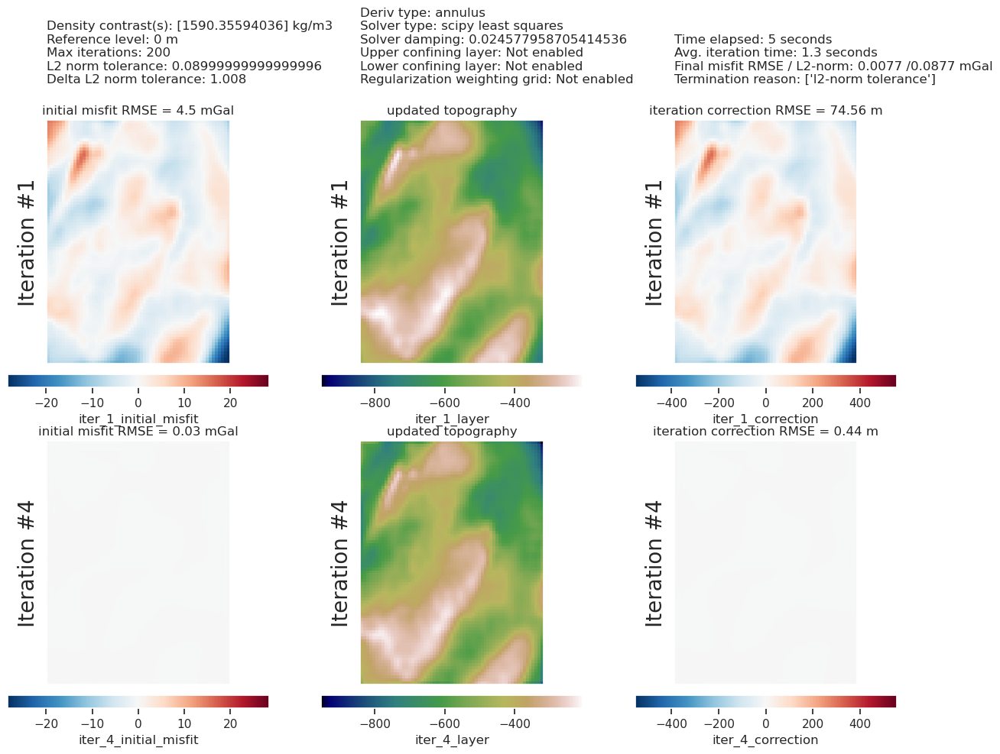

In [21]:
plotting.plot_convergence(
    grav_results,
    parameters,
)
plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bathymetry,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.2c",
)

In [22]:
# sample the inverted topography at the constraint points
constraint_points = utils.sample_grids(
    constraint_points,
    final_topography,
    "inverted_topography",
    coord_names=("easting", "northing"),
)

rmse = utils.rmse(constraint_points.true_upward - constraint_points.inverted_topography)
print(f"RMSE: {rmse:.2f} m")

RMSE: 21.10 m


In [34]:
# save to csv
constraint_points.to_csv("../../results/Ross_Sea_07_constraint_points.csv", index=False)

# Uncertainty analysis

## Inversion error

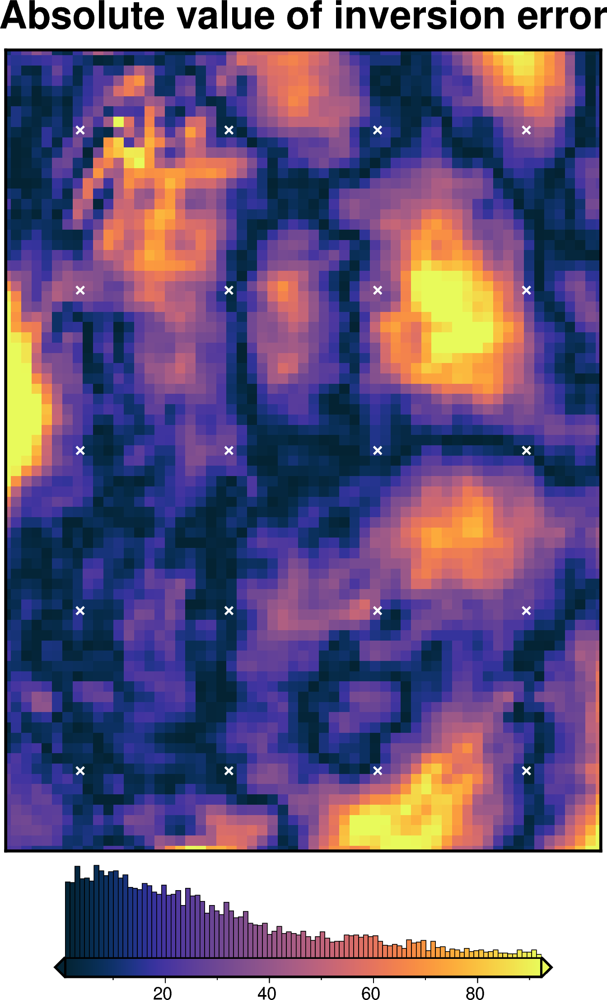

In [45]:
inversion_error = np.abs(bathymetry - final_topography)

fig = maps.plot_grd(
    inversion_error,
    region=vd.pad_region(inversion_region, -spacing),
    hist=True,
    cmap="thermal",
    title="Absolute value of inversion error",
    robust=True,
    points=constraint_points,
    points_style="x.2c",
    points_fill="white",
)
fig.show()

## Redo starting gravity and regional separation
use the optimal determined density contrast

  0%|          | 0/500 [00:00<?, ?it/s]

INFO:invert4geom:Trial with best score: 
INFO:invert4geom:	trial number: 288
INFO:invert4geom:	parameter: {'depth': 106357.34134463646, 'damping': 1.8866586997857605e-11}
INFO:invert4geom:	scores: [0.2536850208572706]


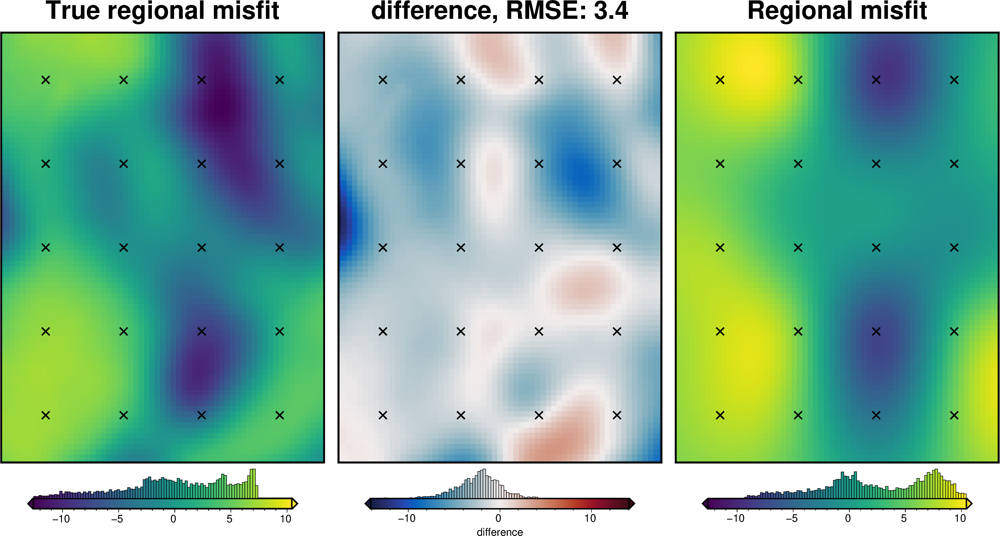

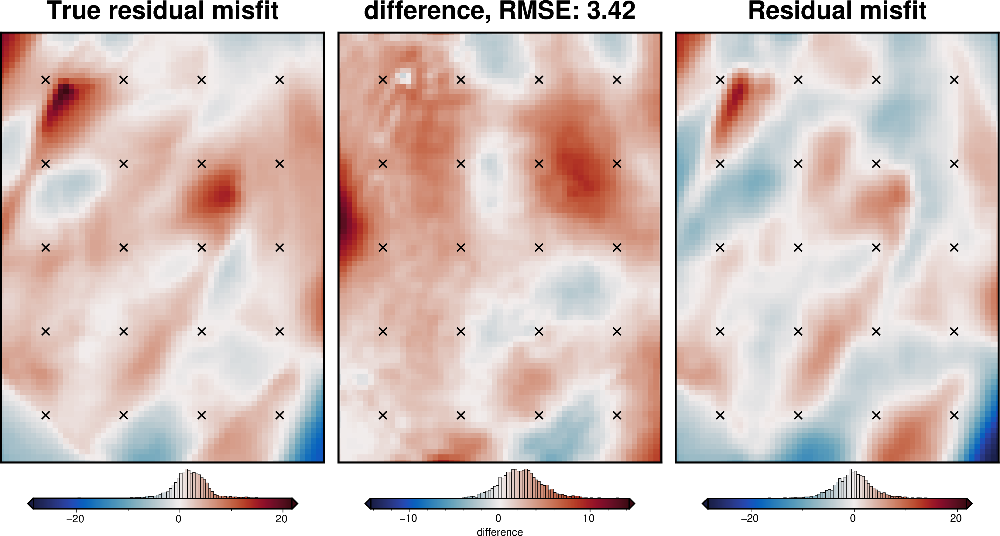

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,starting_gravity,eqs_gravity_anomaly,gravity_anomaly,true_res,misfit,reg,res,staring_res,starting_reg
count,4.941000e+03,4941.00000,4941.0,4941.000000,4941.000000,4.941000e+03,4941.000000,4941.000000,4.941000e+03,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000,4941.000000
mean,-1.600000e+06,110000.00000,1000.0,-28.076339,0.259171,7.362839e-16,-28.076339,-28.072748,3.000000e-01,-29.952698,-28.058026,-28.058026,-2.650495,1.894671,2.392663,-0.497991,-0.497991,2.392663
std,1.169164e+05,88042.99419,0.0,7.267542,0.491861,4.918608e+00,10.294668,10.288298,5.551677e-17,7.786909,10.295847,10.295847,3.791899,6.463962,4.873506,4.474225,4.474225,4.873506
min,-1.800000e+06,-40000.00000,1000.0,-50.834525,-1.000000,-1.259171e+01,-54.678282,-54.558574,3.000000e-01,-53.755619,-54.030668,-54.030668,-21.559979,-20.623795,-9.197998,-28.364332,-28.364332,-9.197998
25%,-1.700000e+06,35000.00000,1000.0,-33.380910,-0.034308,-2.934787e+00,-35.726921,-35.779109,3.000000e-01,-35.307780,-35.784230,-35.784230,-4.572895,-2.149587,-0.970090,-2.685246,-2.685246,-0.970090
50%,-1.600000e+06,110000.00000,1000.0,-28.037682,0.288825,2.965387e-01,-28.106720,-28.066756,3.000000e-01,-29.946676,-27.966904,-27.966904,-2.348591,2.221071,2.254996,-0.313345,-0.313345,2.254996
75%,-1.500000e+06,185000.00000,1000.0,-21.983838,0.677359,4.181878e+00,-20.290869,-20.186209,3.000000e-01,-23.687024,-20.225554,-20.225554,-0.832782,6.425321,6.975442,1.886869,1.886869,6.975442
max,-1.400000e+06,260000.00000,1000.0,-13.088736,1.000000,7.408290e+00,-6.187838,-6.300661,3.000000e-01,-12.429324,-6.902326,-6.902326,16.456882,25.542919,10.429462,15.955001,15.955001,10.429462


In [46]:
# set the reference level from the prisms to 0
zref = 0
density_grid = xr.where(
    starting_bathymetry >= zref,
    best_density_contrast,
    -best_density_contrast,
)
# create layer of prisms
starting_prisms = utils.grids_to_prisms(
    starting_bathymetry,
    zref,
    density=density_grid,
)
grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=False,
)

# regional separation
temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)

# temporarily set some kwargs
temp_reg_kwargs["cv_kwargs"]["plot"] = True
temp_reg_kwargs["cv_kwargs"]["progressbar"] = True

grav_df = regional.regional_separation(
    grav_df=grav_df,
    **temp_reg_kwargs,
)

grav_df["staring_res"] = grav_df.res
grav_df["starting_reg"] = grav_df.reg

regional_comparison(grav_df)
grav_df.describe()

In [47]:
# use optimal eq source parameters for regional separation in uncertainty analysis

# re-load the study from the saved pickle file
with pathlib.Path(f"{regional_grav_kwargs.get('cv_kwargs').get('fname')}.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)
reg_eq_damping = min(study.best_trials, key=lambda t: t.values[0]).params["damping"]
reg_eq_depth = min(study.best_trials, key=lambda t: t.values[0]).params["depth"]

new_regional_grav_kwargs = dict(
    method="constraints",
    grid_method="eq_sources",
    constraints_df=constraint_points,
    damping=reg_eq_damping,
    depth=reg_eq_depth,
    block_size=None,
)
reg_eq_damping, reg_eq_depth

(1.8866586997857605e-11, 106357.34134463646)

In [48]:
# add best damping parameter to kwargs
kwargs["solver_damping"] = best_damping

# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=new_regional_grav_kwargs,
    **kwargs,
)

## Solver damping component

In [ ]:
# load study
with pathlib.Path("../../results/Ross_Sea_07_damping_cv_damping_cv_study.pickle").open(
    "rb"
) as f:
    study = pickle.load(f)

study_df = study.trials_dataframe().drop(columns=["user_attrs_results"])
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

# pick damping standard deviation based on optimization
stdev = np.log10(study_df2.params_damping).std()
print(f"calculated stdev: {stdev}")
# stdev = .1
print(f"using stdev: {stdev}")

calculated stdev: 0.22313186358860268
using stdev: 0.22313186358860268


best: 0.024577958705414536 
std: 0.22313186358860268 
+1std: 0.04108446857737147 
-1std: 0.014703270482553484


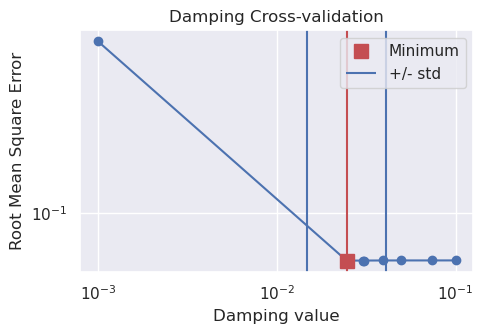

In [40]:
fig = plotting.plot_cv_scores(
    study_df.value,
    study_df.params_damping,
    param_name="Damping",
    logx=True,
    logy=True,
)
ax = fig.axes[0]

best = float(study_df2.params_damping.iloc[0])
upper = float(10 ** (np.log10(best) + stdev))
lower = float(10 ** (np.log10(best) - stdev))

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.027558815401522663, min: 0.010556660503383237, max: 0.05722226777411903
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_damping' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_damping'



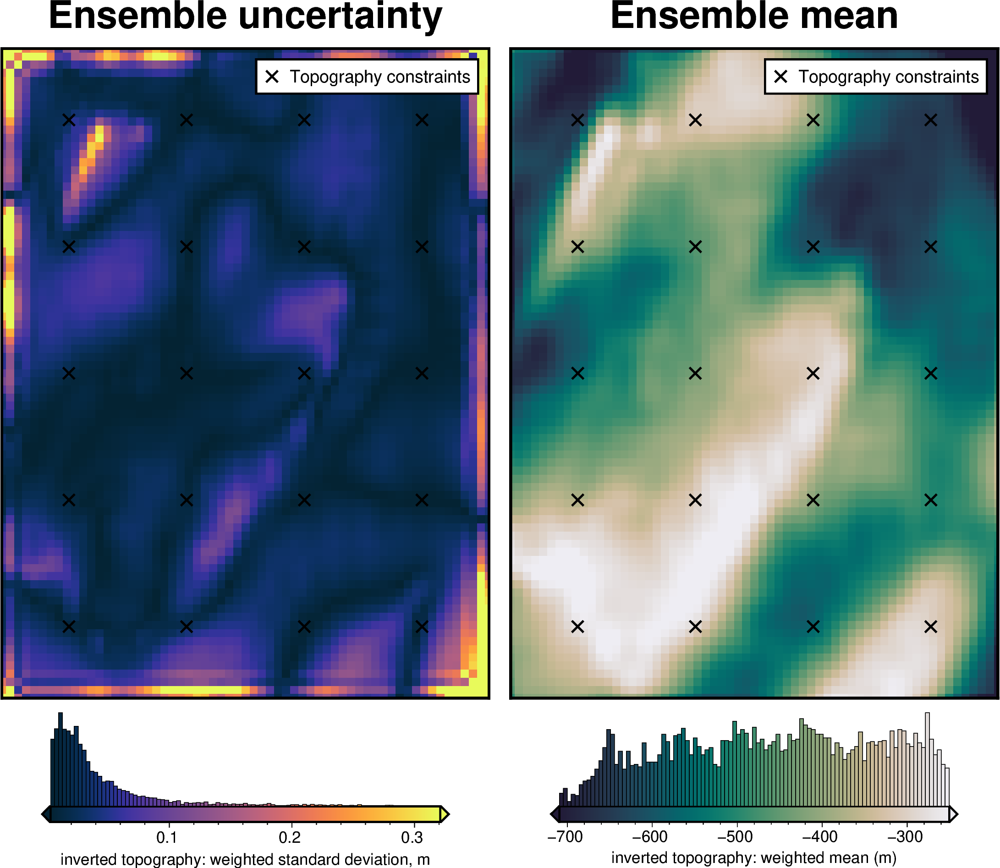

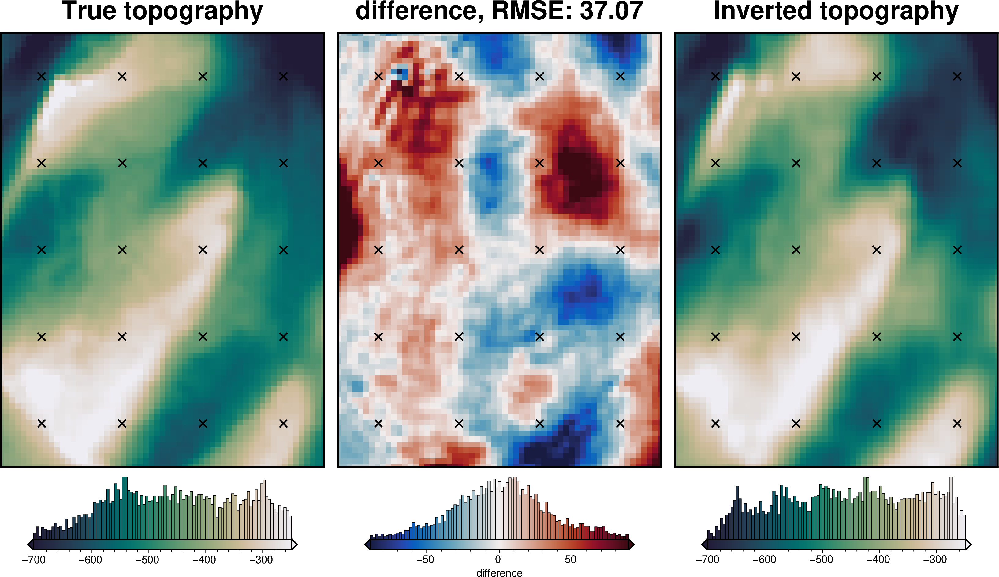

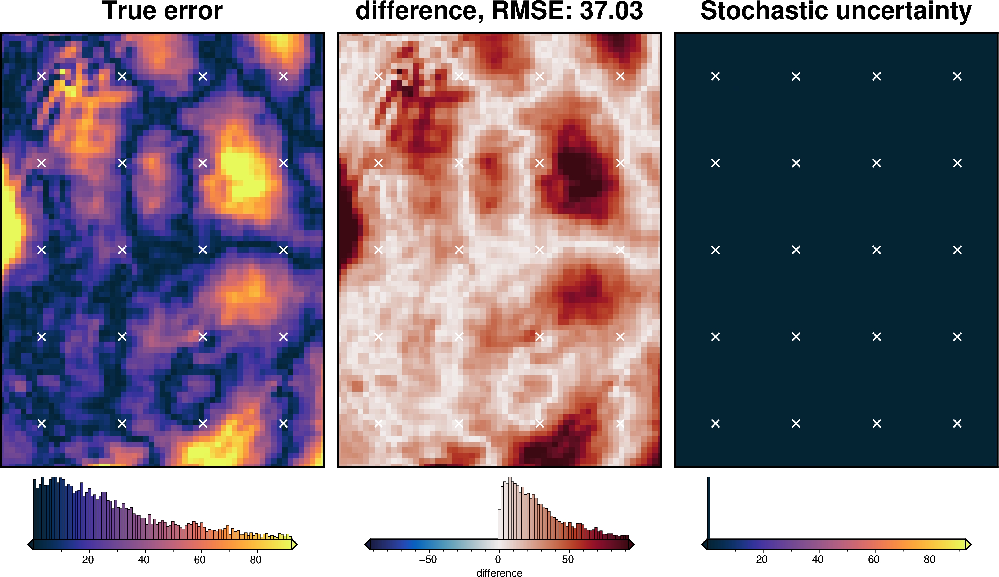

In [41]:
solver_dict = {
    "solver_damping": {
        "distribution": "normal",
        "loc": np.log10(best_damping),  # mean of base 10 exponent
        "scale": stdev,  # standard deviation of base 10 exponent
        "log": True,
    },
}
fname = "../../results/Ross_Sea_07_uncertainty_damping"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_damping_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=solver_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_damping_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Density component

In [ ]:
# load study
with pathlib.Path("../../results/Ross_Sea_07_density_cv_study.pickle").open("rb") as f:
    study = pickle.load(f)

study_df = study.trials_dataframe()
study_df = study_df.sort_values("value")

# calculate zscores of values
study_df["value_zscore"] = sp.stats.zscore(study_df["value"])

# drop outliers (values with zscore > |2|)
study_df2 = study_df[(np.abs(study_df.value_zscore) < 2)]

stdev = study_df2.params_density_contrast.std()
print(f"calculated stdev: {stdev}")

# manually pick a stdev
# stdev = 5
print(f"using stdev: {stdev}")

calculated stdev: 100.48141086167465
using stdev: 100.48141086167465


best: 1590.3559403649456 
std: 100.48141086167465 
+1std: 1690.8373512266203 
-1std: 1489.8745295032709


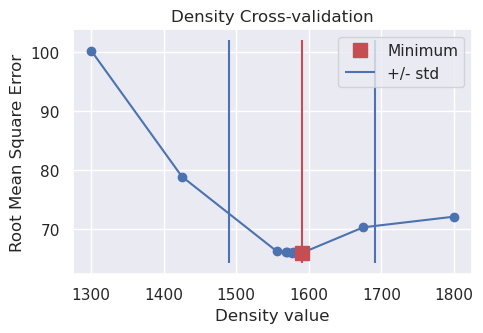

In [43]:
fig = plotting.plot_cv_scores(
    study.trials_dataframe().value.values,
    study.trials_dataframe().params_density_contrast.values,
    param_name="Density",
    logx=False,
    logy=False,
)
ax = fig.axes[0]

best = study_df2.params_density_contrast.iloc[0]
upper = best + stdev
lower = best - stdev

y_lims = ax.get_ylim()
ax.vlines(best, ymin=y_lims[0], ymax=y_lims[1], color="r")
ax.vlines(upper, ymin=y_lims[0], ymax=y_lims[1], label="+/- std")
ax.vlines(lower, ymin=y_lims[0], ymax=y_lims[1])

x_lims = ax.get_xlim()
ax.set_xlim(
    min(x_lims[0], lower),
    max(x_lims[1], upper),
)
ax.legend()
print("best:", best, "\nstd:", stdev, "\n+1std:", upper, "\n-1std:", lower)

INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1590.3559403649456, min: 1425.078727267919, max: 1755.6331534619721
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_density' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_density'



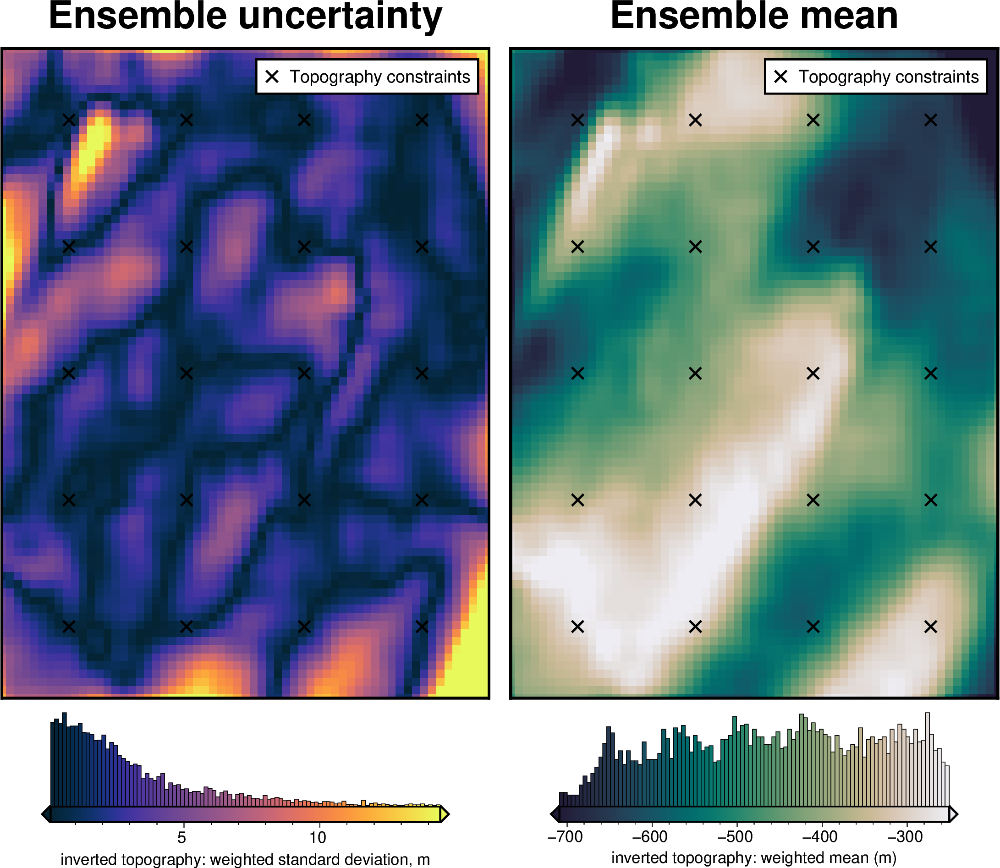

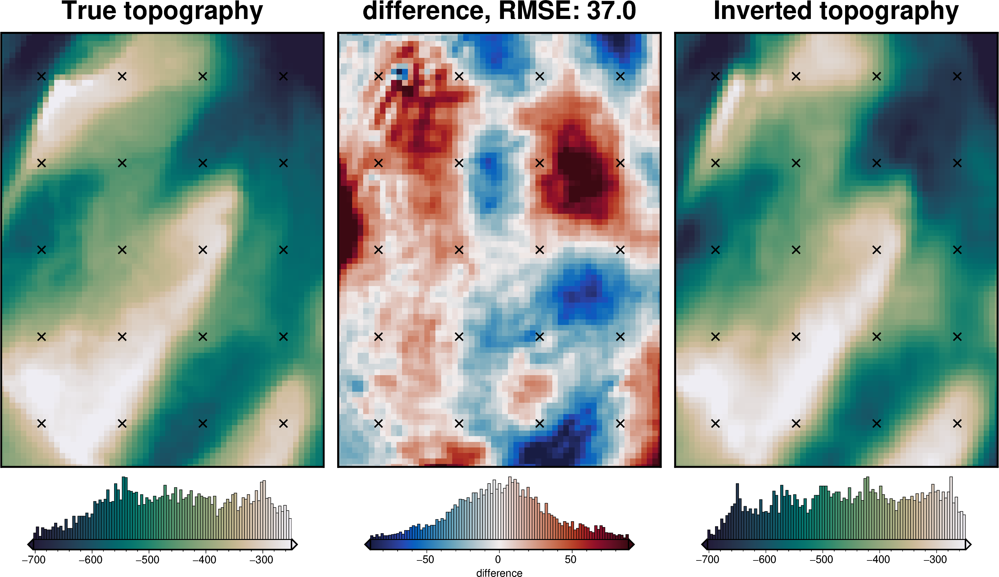

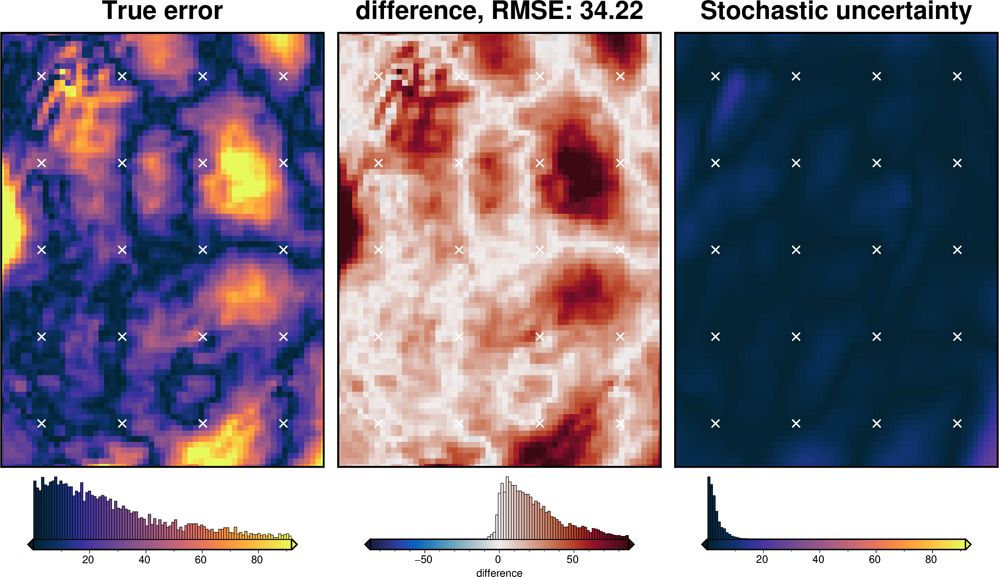

In [44]:
density_dict = {
    "density_contrast": {
        "distribution": "normal",
        "loc": best_density_contrast,
        "scale": stdev,
    },
}
fname = "../../results/Ross_Sea_07_uncertainty_density"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_density_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    parameter_dict=density_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_density_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Constraints component

In [45]:
# set uncertainty as 5% of each points depth
uncert = np.abs(0.05 * constraint_points.upward)
constraint_points.loc[constraint_points.index, "uncert"] = uncert
constraint_points

,northing,easting,true_upward,upward,true_uncert,weight,starting_bathymetry,inverted_topography,uncert
0,-1756000.0,1250.0,-277.117397,-275.375295,13.855870,0.005209,-275.357134,-273.009960,13.768765
1,-1756000.0,73750.0,-292.754172,-294.687884,14.637709,0.004667,-294.818837,-290.413389,14.734394
2,-1756000.0,146250.0,-587.490438,-568.678329,29.374522,0.001159,-568.378302,-568.661628,28.433916
3,-1756000.0,218750.0,-303.910608,-302.316595,15.195530,0.004331,-302.509859,-301.900884,15.115830
4,-1678000.0,1250.0,-356.930926,-366.490774,17.846546,0.003140,-366.557202,-369.999867,18.324539
5,-1678000.0,73750.0,-305.091241,-299.575267,15.254562,0.004297,-299.685539,-301.638984,14.978763
6,-1678000.0,146250.0,-444.497296,-415.516071,22.224865,0.002025,-415.491586,-415.745812,20.775804
7,-1678000.0,218750.0,-528.725284,-503.688001,26.436264,0.001431,-503.551367,-503.799264,25.184400
8,-1600000.0,1250.0,-549.225696,-568.551170,27.461285,0.001326,-568.425920,-565.211034,28.427558
9,-1600000.0,73750.0,-404.192068,-429.765734,20.209603,0.002448,-429.722012,-430.601001,21.488287


INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_constraints' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_constraints'



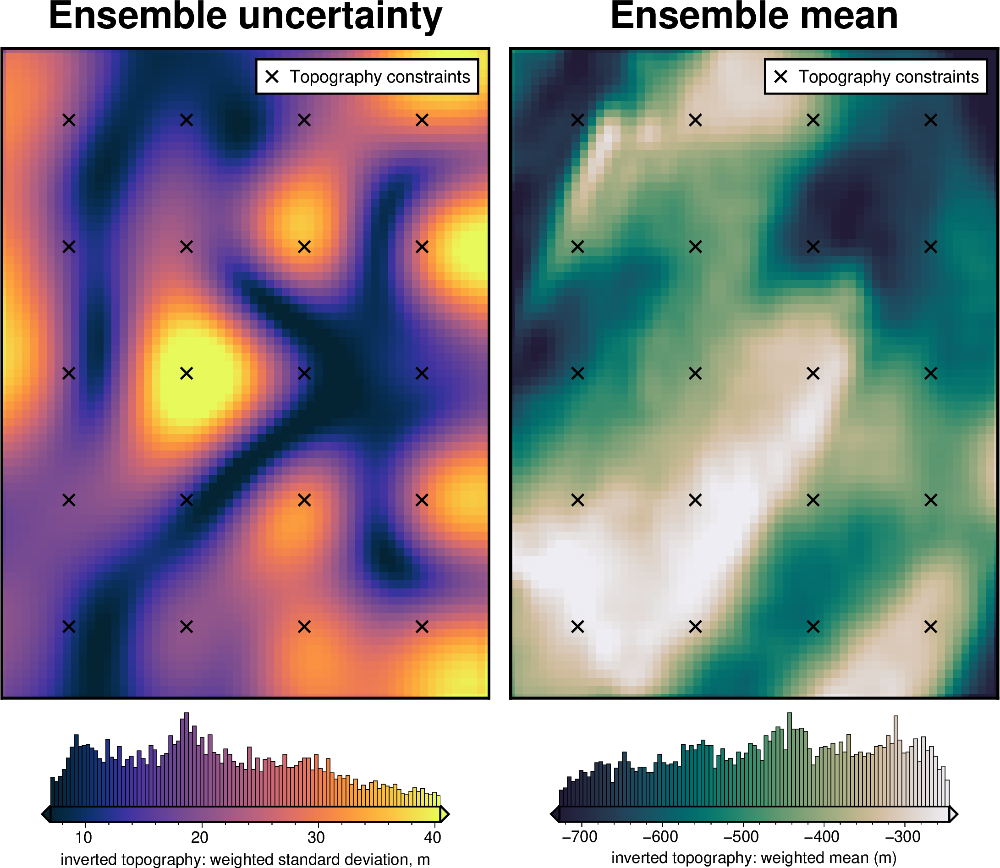

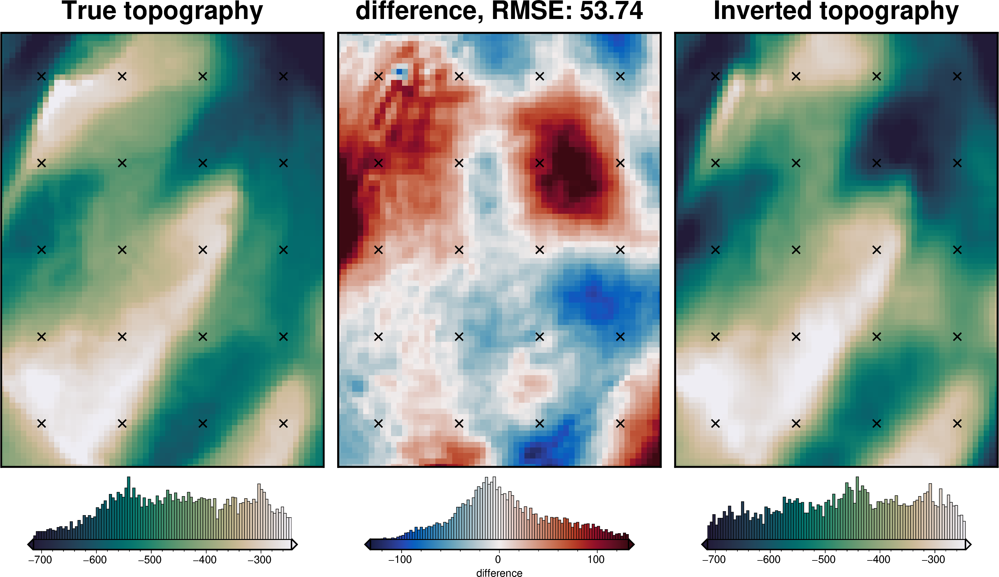

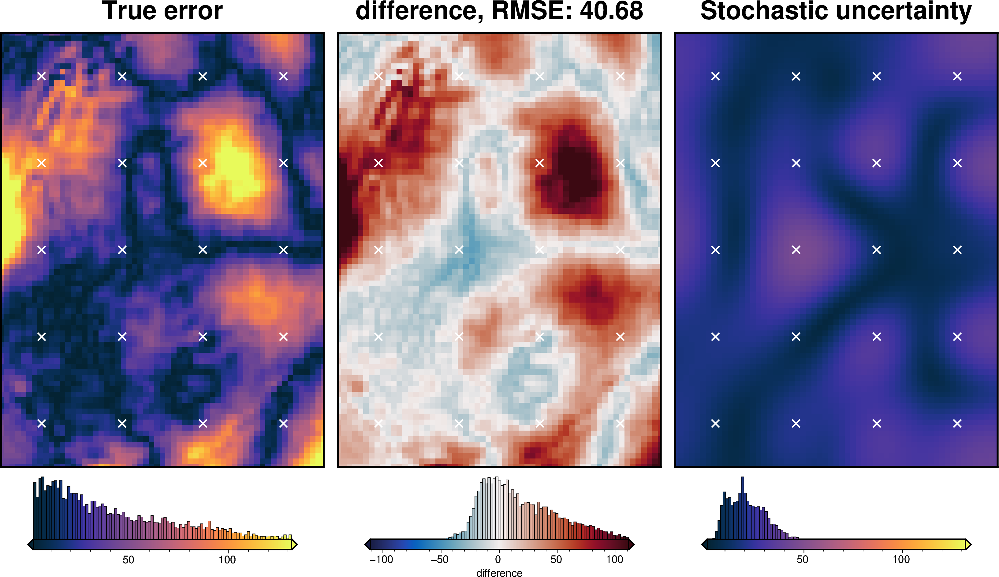

In [46]:
fname = "../../results/Ross_Sea_07_uncertainty_constraints"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_constraints_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    sample_constraints=True,
    constraints_df=constraint_points,
    starting_topography_kwargs=starting_topography_kwargs,
    runs=10,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_constraints_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Gravity component

INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_grav' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_grav'



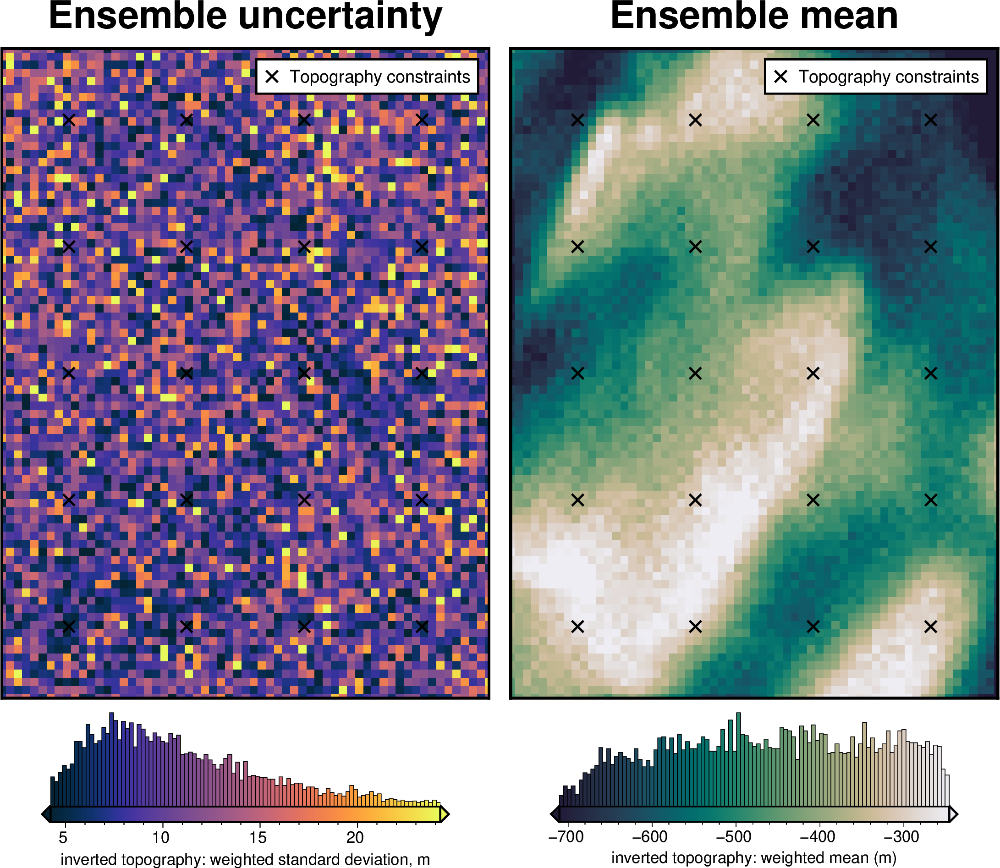

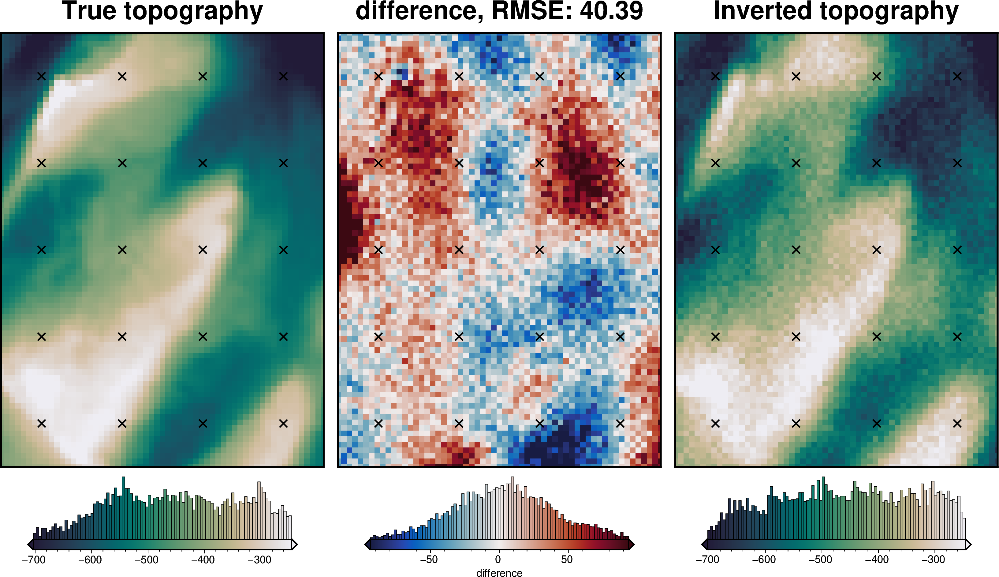

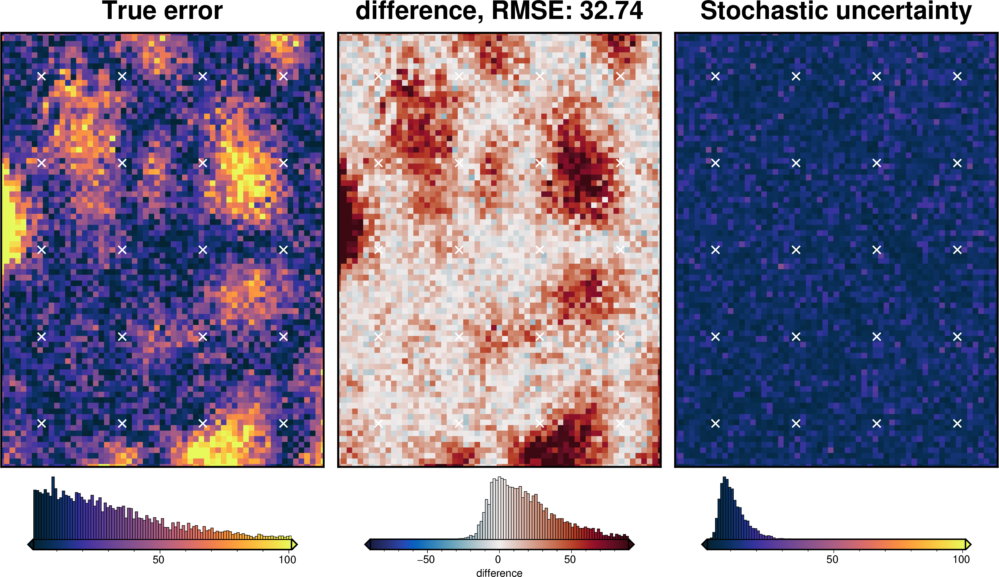

In [47]:
fname = "../../results/Ross_Sea_07_uncertainty_grav"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_grav_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    sample_gravity=True,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_grav_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Regional gravity component

In [63]:
# # if depth="default" in EquivalentSources, it will use 4.5 times the mean distances
# # between nearest points as the depth
# # calculate that mean distance below.
# mean_constraint_distance = np.mean(
#     vd.median_distance(
#         (constraint_points.easting, constraint_points.northing), k_nearest=1
#     )
# )
# mean_constraint_distance

In [48]:
reg_eq_damping, reg_eq_depth

(1.8866586997857605e-11, 106357.34134463646)

In [52]:
np.abs(np.log10(reg_eq_damping)) / 2

np.float64(5.362153328721452)

INFO:invert4geom:Sampled 'depth' parameter values; mean: 106357.34134463646, min: -441559.3716214988, max: 654274.0543107716
INFO:invert4geom:Sampled 'damping' parameter values; mean: 12.326377341385111, min: 2.908718333839037e-25, max: 1223.7283370024145


starting regional ensemble:   0%|          | 0/100 [00:00<?, ?it/s]

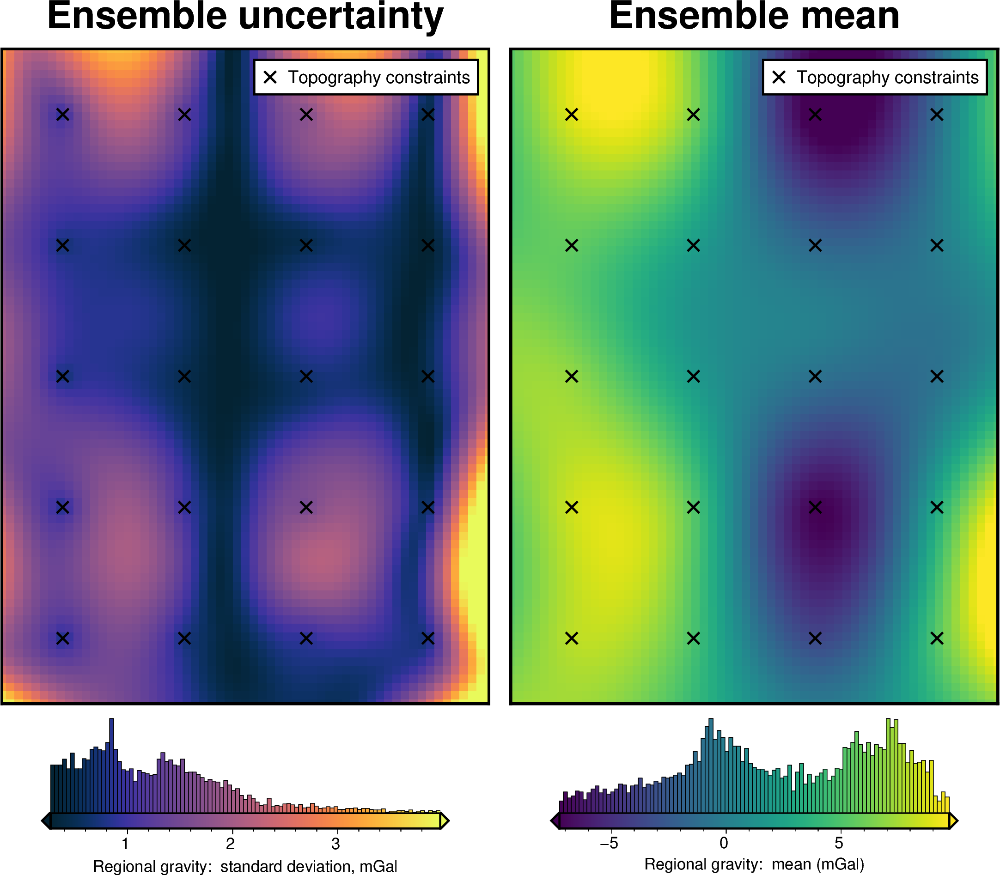

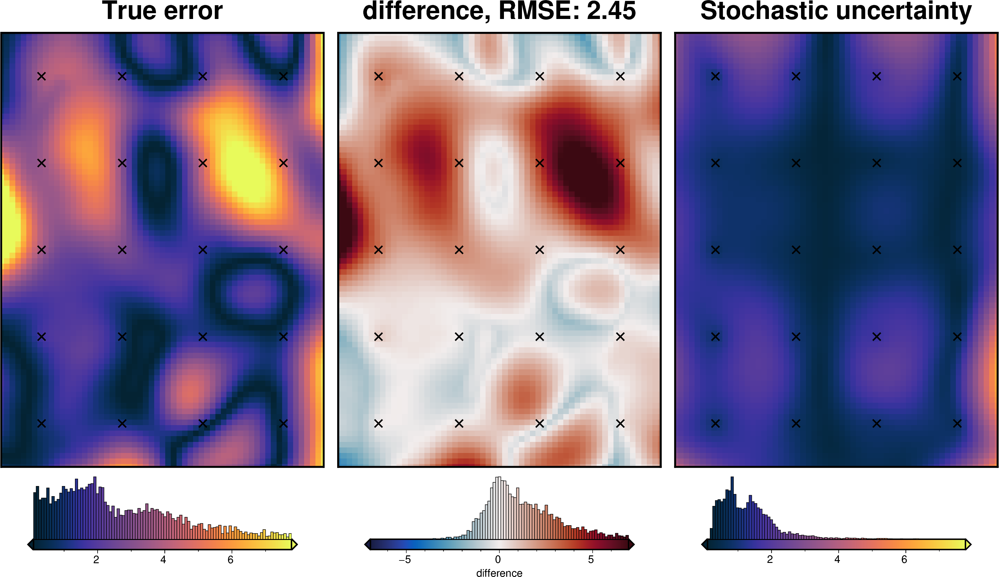

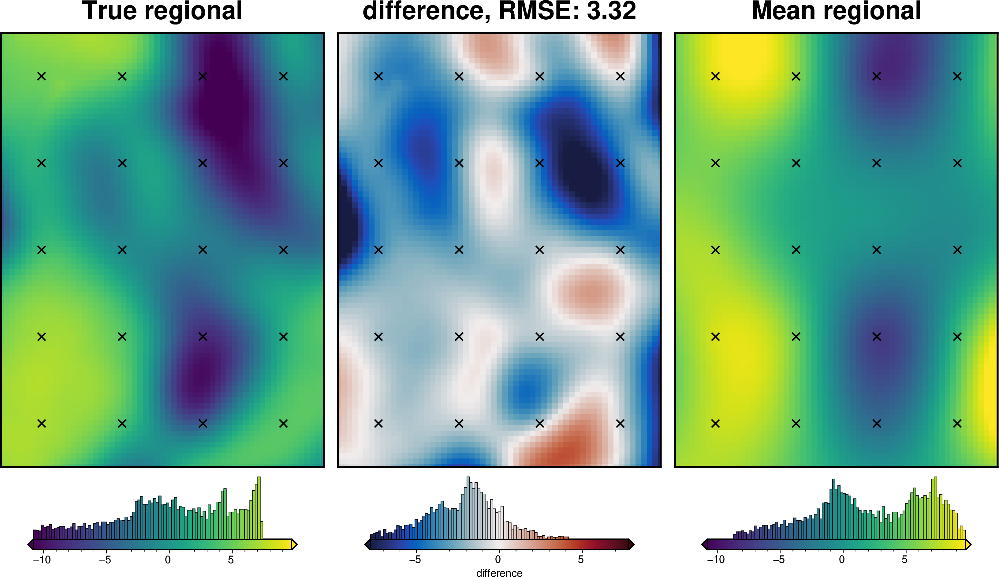

In [53]:
regional_misfit_parameter_dict = {
    "depth": {
        # "distribution": "uniform",
        # "loc": 1 * mean_constraint_distance,  # lower bound
        # "scale": 10 * mean_constraint_distance,  # range
        "distribution": "normal",
        "loc": reg_eq_depth,  # mean
        "scale": reg_eq_depth * 2,  # standard deviation
    },
    "damping": {
        "distribution": "normal",
        "loc": np.log10(reg_eq_damping),  # mean base 10 exponent
        "scale": np.abs(np.log10(reg_eq_damping)) / 2,  # standard deviation of exponent
        "log": True,
    },
}

regional_misfit_stats = uncertainty.regional_misfit_uncertainty(
    runs=100,
    parameter_dict=regional_misfit_parameter_dict,
    plot_region=vd.pad_region(inversion_region, -spacing),
    true_regional=grav_grid.basement_grav,
    # weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
    grav_df=grav_df,
    **new_regional_grav_kwargs,
)

In [54]:
grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
grav_grid["reg_uncert"] = regional_misfit_stats.z_stdev
grav_df = vd.grid_to_table(grav_grid)
grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,uncert,eqs_gravity_anomaly,gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-22.417501,0.3,-22.453228,-22.453228,-19.062575,-11.864706,-3.390653,6.084071,-9.474724,5.370161
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-20.803706,0.3,-20.452633,-20.452633,-18.792216,-10.762418,-1.660417,6.189401,-7.849818,4.918048
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-19.488174,0.3,-19.507269,-19.507269,-18.530713,-10.189173,-0.976556,6.292271,-7.268827,4.495100
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-18.748448,0.3,-19.144625,-19.144625,-18.281720,-9.718220,-0.862905,6.391332,-7.254238,4.101620
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-18.181498,0.3,-18.885928,-18.885928,-18.048032,-9.290557,-0.837896,6.485027,-7.322923,3.737961
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4936,-1400000.0,240000.0,1000.0,-48.323584,0.243973,-0.151982,-48.475566,-47.841659,0.3,-49.159135,-49.159135,-45.031204,-10.098100,-4.127931,0.844471,-4.972402,2.827392
4937,-1400000.0,245000.0,1000.0,-48.356131,0.167427,-0.917439,-49.273571,-49.416021,0.3,-49.644093,-49.644093,-45.622814,-9.628450,-4.021279,1.283505,-5.304784,3.626047
4938,-1400000.0,250000.0,1000.0,-49.079005,0.076264,-1.829069,-50.908074,-50.280223,0.3,-50.340857,-50.340857,-46.166463,-9.889838,-4.174395,1.674626,-5.849021,4.482656
4939,-1400000.0,255000.0,1000.0,-49.877171,-0.022265,-2.814361,-52.691532,-52.909670,0.3,-51.730957,-51.730957,-46.660815,-10.268365,-5.070142,2.018618,-7.088760,5.385375


INFO:invert4geom:Sampled 'depth' parameter values; mean: 106357.34134463647, min: -243527.17598264577, max: 456241.85867191857
INFO:invert4geom:Sampled 'damping' parameter values; mean: 0.0012470697676899398, min: 2.855853936422179e-20, max: 0.012463806373573173
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_regional' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_regional'



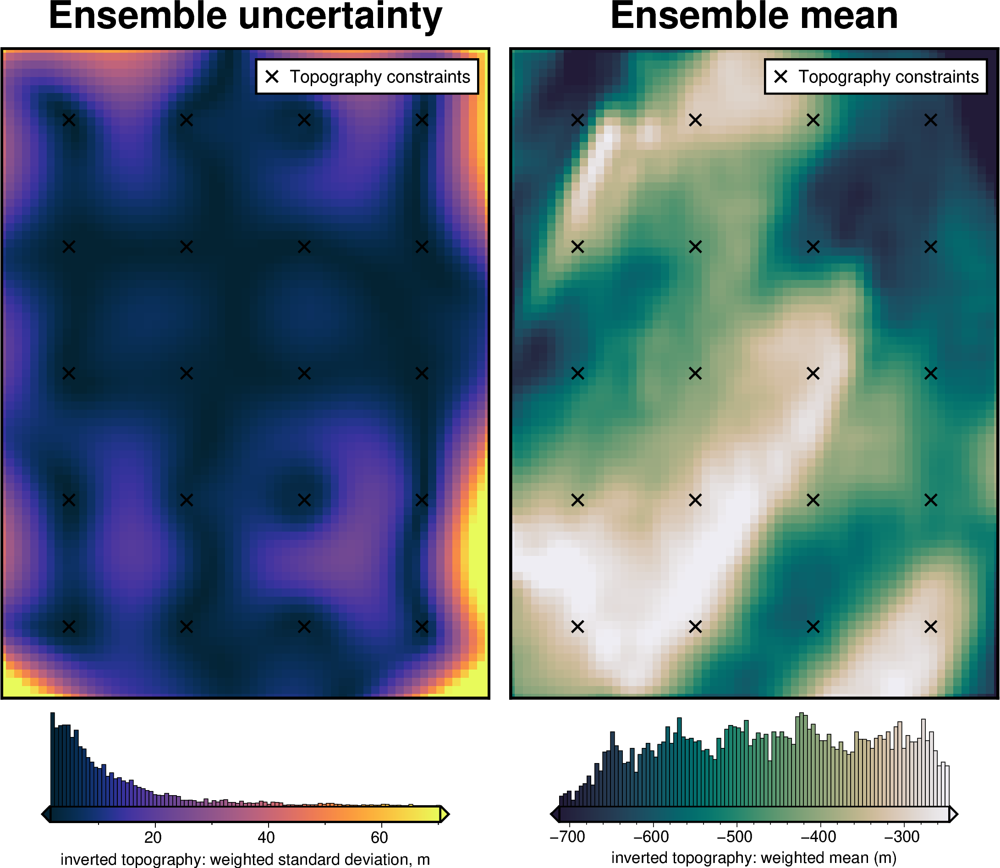

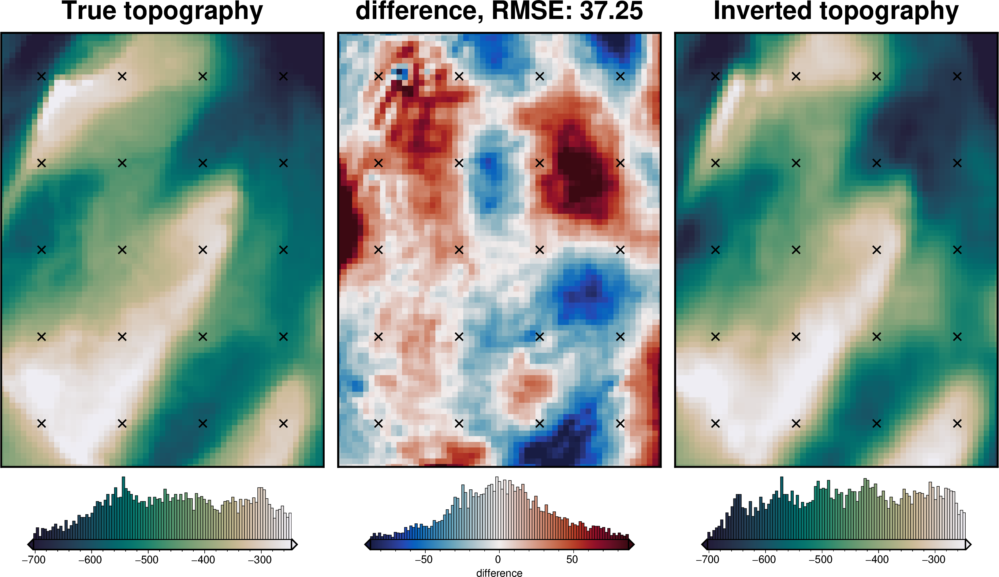

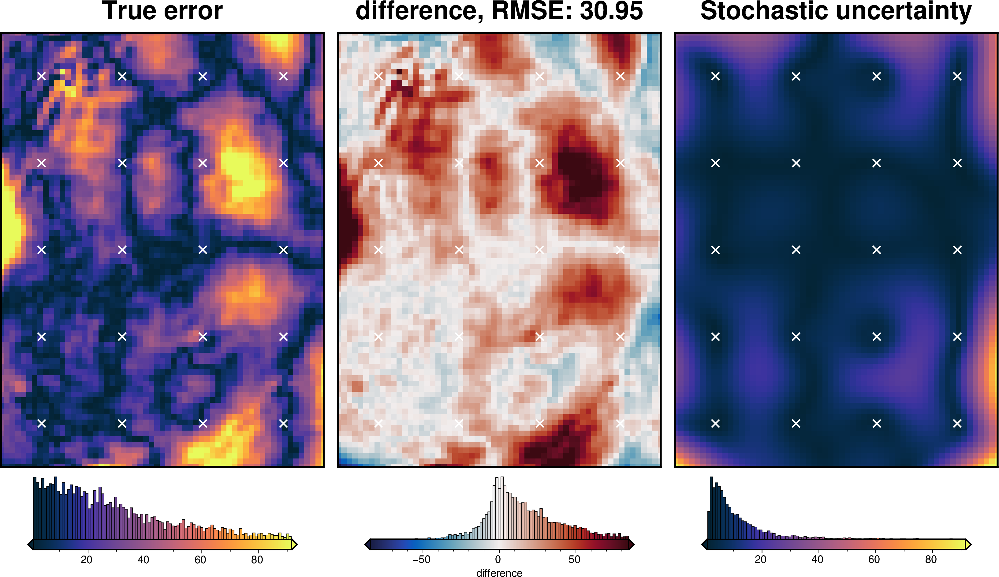

In [55]:
fname = "../../results/Ross_Sea_07_uncertainty_regional"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_regional_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    regional_misfit_parameter_dict=regional_misfit_parameter_dict,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_regional_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Equivalent source gridding component

In [57]:
eqs.depth, eqs.damping

(57156.0665071041, 1.5369755553384883e-20)

In [58]:
np.abs(np.log10(eqs.damping)) / 2

np.float64(9.906666519817476)

In [60]:
grav_grid

<xarray.Dataset> Size: 594kB
Dimensions:                            (northing: 81, easting: 61)
Coordinates:
  * northing                           (northing) float64 648B -1.8e+06 ... -...
  * easting                            (easting) float64 488B -4e+04 ... 2.6e+05
Data variables: (12/15)
    upward                             (northing, easting) float64 40kB 1e+03...
    bathymetry_grav                    (northing, easting) float64 40kB -28.0...
    basement_grav_normalized           (northing, easting) float64 40kB 0.830...
    basement_grav                      (northing, easting) float64 40kB 5.71 ...
    gravity_anomaly_full_res_no_noise  (northing, easting) float64 40kB -22.3...
    gravity_anomaly_full_res           (northing, easting) float64 40kB -22.4...
    ...                                 ...
    starting_gravity                   (northing, easting) float64 40kB -19.0...
    true_res                           (northing, easting) float64 40kB -11.8...
    misfit                             (northing, easting) float64 40kB -3.39...
    reg                                (northing, easting) float64 40kB 6.084...
    res                                (northing, easting) float64 40kB -9.47...
    reg_uncert                         (northing, easting) float64 40kB 5.37 ...

INFO:invert4geom:Sampled 'depth' parameter values; mean: 57156.0665071041, min: 33652.725682981654, max: 80659.40733122654
INFO:invert4geom:Sampled 'damping' parameter values; mean: 3.031682552180632e-05, min: 7.792029790060381e-37, max: 0.00030316797052308076


starting equivalent sources ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

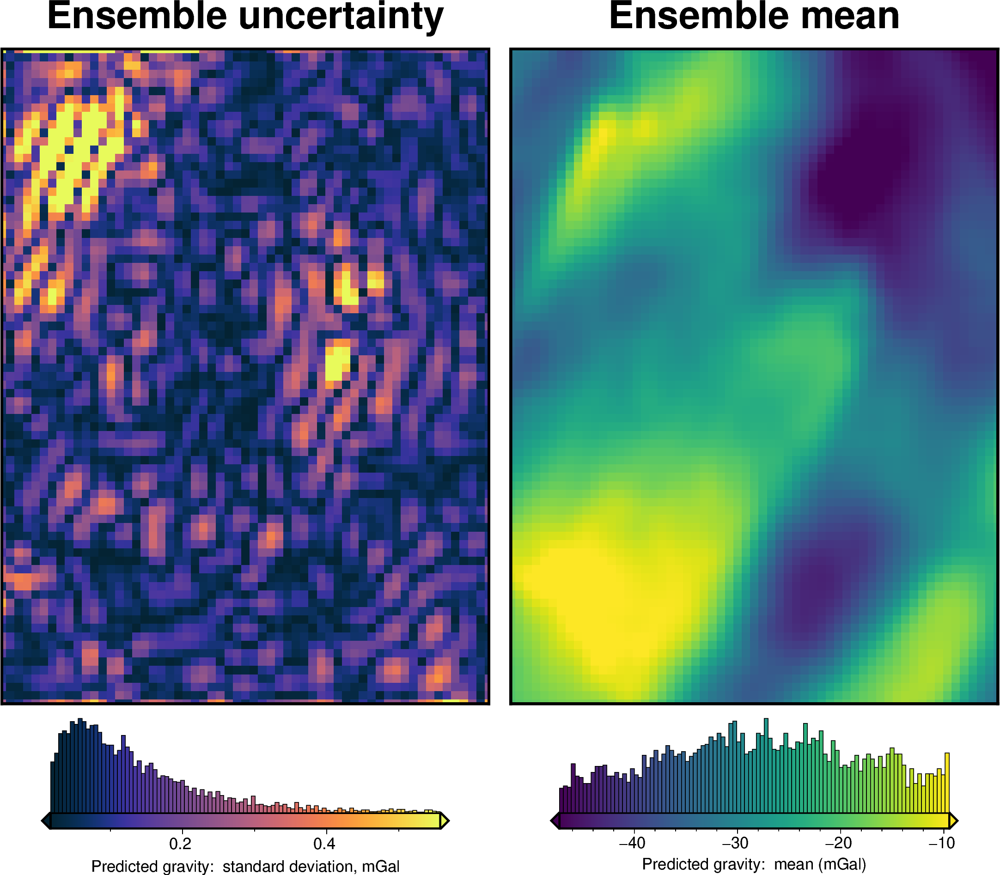

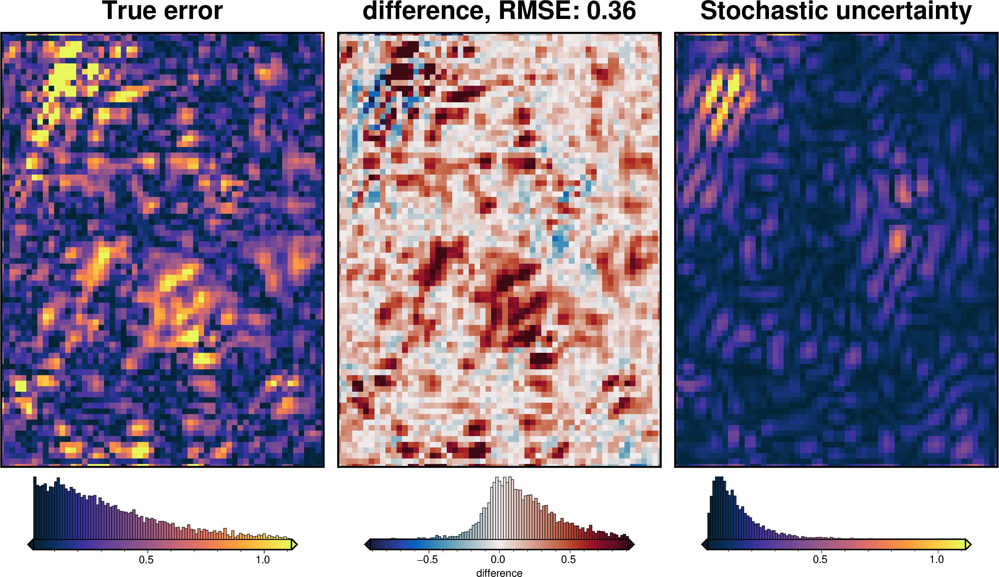

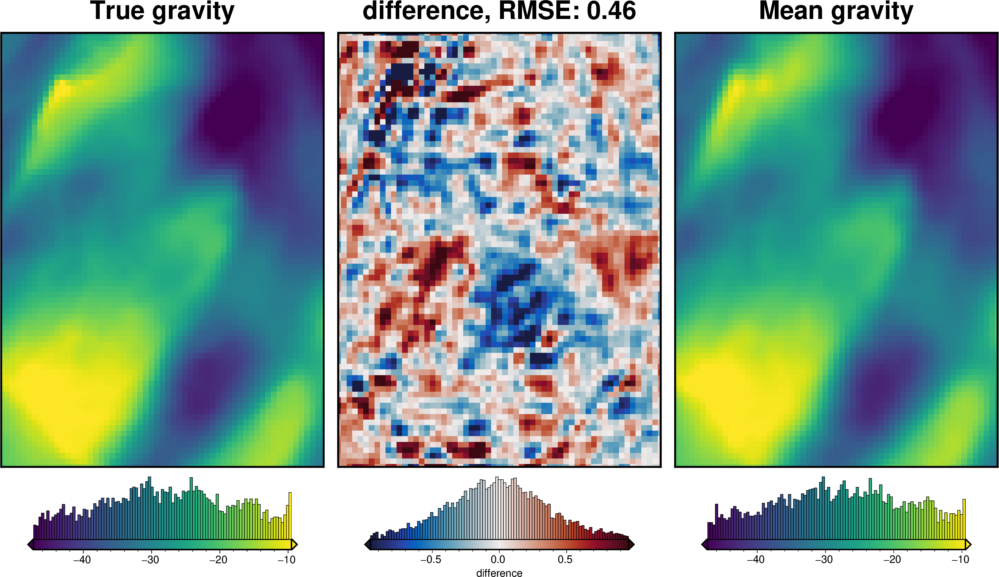

In [61]:
# grid the airborne survey data over the whole grid
coords = (grav_survey_df.easting, grav_survey_df.northing, grav_survey_df.upward)
data = grav_survey_df.gravity_anomaly

equivalent_source_parameter_dict = {
    "depth": {
        # "distribution": "uniform",
        # "loc": 2*min_dist,  # lower bound
        # "scale": 6*min_dist,  # range
        "distribution": "normal",
        "loc": eqs.depth,  # mean
        "scale": eqs.depth / 4,  # 20e3,  # standard deviation
    },
    "damping": {
        # "distribution": "uniform",
        # "loc": -40,  # lower bound base 10 exponent
        # "scale": 40,  # range of exponent
        "log": True,
        "distribution": "normal",
        "loc": np.log10(eqs.damping),  # mean
        "scale": np.abs(np.log10(eqs.damping)) / 2,  # standard deviation
    },
}

eqs_kwargs = dict(
    block_size=spacing * 2,
    damping=None,
    depth="default",
)

regional_misfit_stats = uncertainty.equivalent_sources_uncertainty(
    runs=10,
    data=data,
    coords=coords,
    grid_points=grav_df,
    parameter_dict=equivalent_source_parameter_dict,
    plot_region=vd.pad_region(inversion_region, -spacing),
    true_gravity=grav_grid.gravity_anomaly_full_res_no_noise,
    # weight_by="score",
    # weight_by="rmse",
    **eqs_kwargs,
)

In [62]:
grav_df_eqs_uncert = utils.sample_grids(
    grav_df,
    regional_misfit_stats.z_stdev,
    sampled_name="uncert",
    coord_names=["easting", "northing"],
)
grav_df_eqs_uncert = utils.sample_grids(
    grav_df_eqs_uncert,
    regional_misfit_stats.z_mean,
    sampled_name="gravity_anomaly",
    coord_names=["easting", "northing"],
)
grav_df_eqs_uncert

,northing,easting,upward,bathymetry_grav,basement_grav_normalized,basement_grav,gravity_anomaly_full_res_no_noise,gravity_anomaly_full_res,eqs_gravity_anomaly,starting_gravity,true_res,misfit,reg,res,reg_uncert,predicted_grav,uncert,gravity_anomaly
0,-1800000.0,-40000.0,1000.0,-28.046289,0.830177,5.710065,-22.336224,-22.417501,-22.453228,-19.062575,-11.864706,-3.390653,6.084071,-9.474724,5.370161,-21.993275,1.715817,-22.731609
1,-1800000.0,-35000.0,1000.0,-26.714502,0.867672,6.085010,-20.629492,-20.803706,-20.452633,-18.792216,-10.762418,-1.660417,6.189401,-7.849818,4.918048,-20.450028,0.472282,-20.630781
2,-1800000.0,-30000.0,1000.0,-25.919276,0.898289,6.391175,-19.528100,-19.488174,-19.507269,-18.530713,-10.189173,-0.976556,6.292271,-7.268827,4.495100,-19.599002,0.132442,-19.532606
3,-1800000.0,-25000.0,1000.0,-25.236960,0.921973,6.628021,-18.608940,-18.748448,-19.144625,-18.281720,-9.718220,-0.862905,6.391332,-7.254238,4.101620,-19.255206,0.440946,-19.011936
4,-1800000.0,-20000.0,1000.0,-24.610928,0.937189,6.780179,-17.830750,-18.181498,-18.885928,-18.048032,-9.290557,-0.837896,6.485027,-7.322923,3.737961,-19.057972,0.697598,-18.651644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4936,-1400000.0,240000.0,1000.0,-48.323584,0.243973,-0.151982,-48.475566,-47.841659,-49.159135,-45.031204,-10.098100,-4.127931,0.844471,-4.972402,2.827392,-48.938691,0.399066,-48.973045
4937,-1400000.0,245000.0,1000.0,-48.356131,0.167427,-0.917439,-49.273571,-49.416021,-49.644093,-45.622814,-9.628450,-4.021279,1.283505,-5.304784,3.626047,-49.482401,0.234819,-49.518875
4938,-1400000.0,250000.0,1000.0,-49.079005,0.076264,-1.829069,-50.908074,-50.280223,-50.340857,-46.166463,-9.889838,-4.174395,1.674626,-5.849021,4.482656,-50.195277,0.215251,-50.276936
4939,-1400000.0,255000.0,1000.0,-49.877171,-0.022265,-2.814361,-52.691532,-52.909670,-51.730957,-46.660815,-10.268365,-5.070142,2.018618,-7.088760,5.385375,-51.415788,0.576887,-51.612366


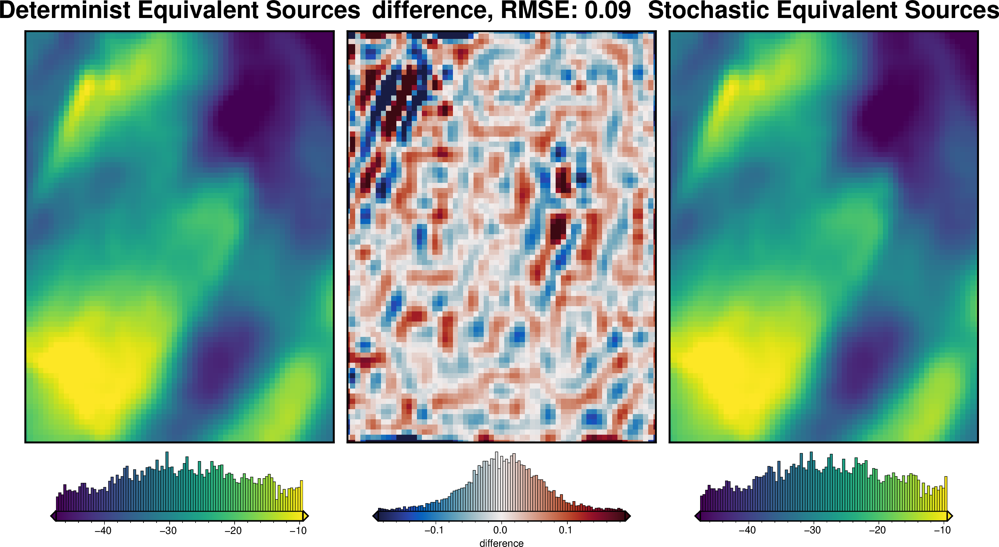

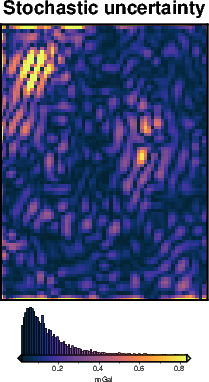

In [63]:
grav_grid = grav_df_eqs_uncert.set_index(["northing", "easting"]).to_xarray()
_ = polar_utils.grd_compare(
    grav_grid.eqs_gravity_anomaly,
    grav_grid.gravity_anomaly,
    region=inversion_region,
    plot=True,
    grid1_name="Determinist Equivalent Sources",
    grid2_name="Stochastic Equivalent Sources",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
)
maps.plot_grd(
    grav_grid.uncert,
    region=inversion_region,
    fig_height=10,
    title="Stochastic uncertainty",
    cmap="thermal",
    hist=True,
    robust=True,
    cbar_label="mGal",
)

In [64]:
grav_df_eqs_uncert["starting_gravity"] = grav_df.starting_gravity

grav_df_eqs_uncert = regional.regional_separation(
    grav_df=grav_df_eqs_uncert,
    **new_regional_grav_kwargs,
)

grav_df_eqs_uncert["staring_res"] = grav_df_eqs_uncert.res
grav_df_eqs_uncert["starting_reg"] = grav_df_eqs_uncert.reg

# kwargs to reuse for all uncertainty analyses
eqs_uncert_kwargs = dict(
    grav_df=grav_df_eqs_uncert,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=new_regional_grav_kwargs,
    **kwargs,
)

In [65]:
# save to csv
grav_df_eqs_uncert.to_csv("../../results/Ross_Sea_07_grav_df.csv", index=False)

INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_eq_sources' found, creating new files



stochastic ensemble:   0%|          | 0/10 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 10
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_eq_sources'



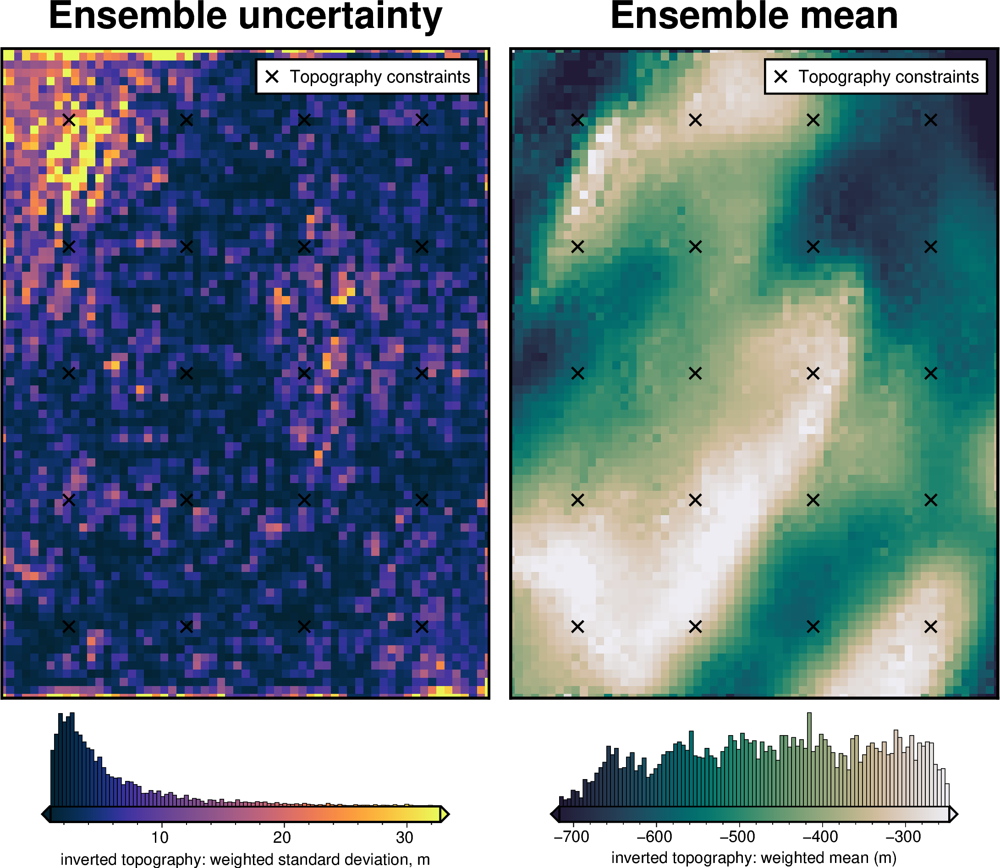

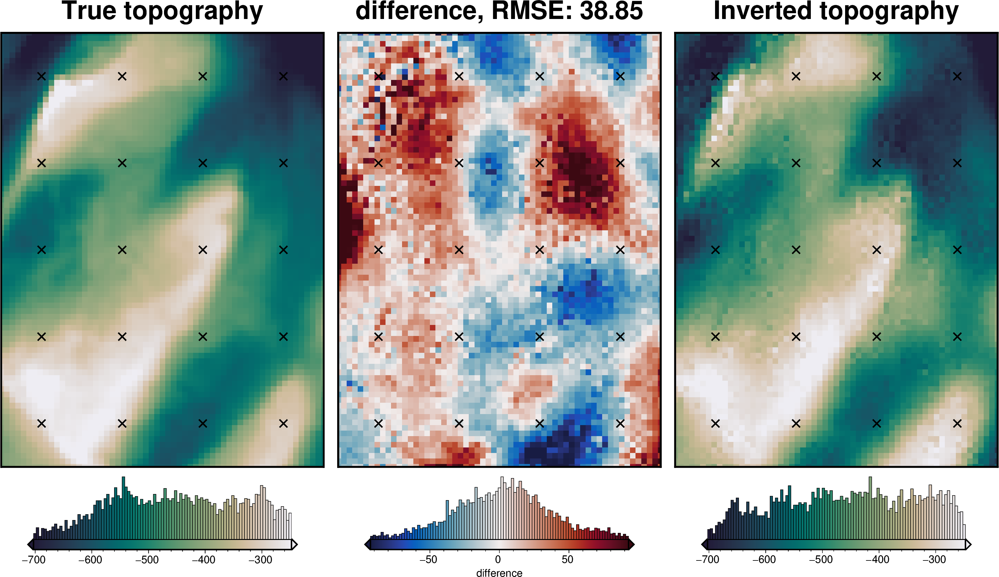

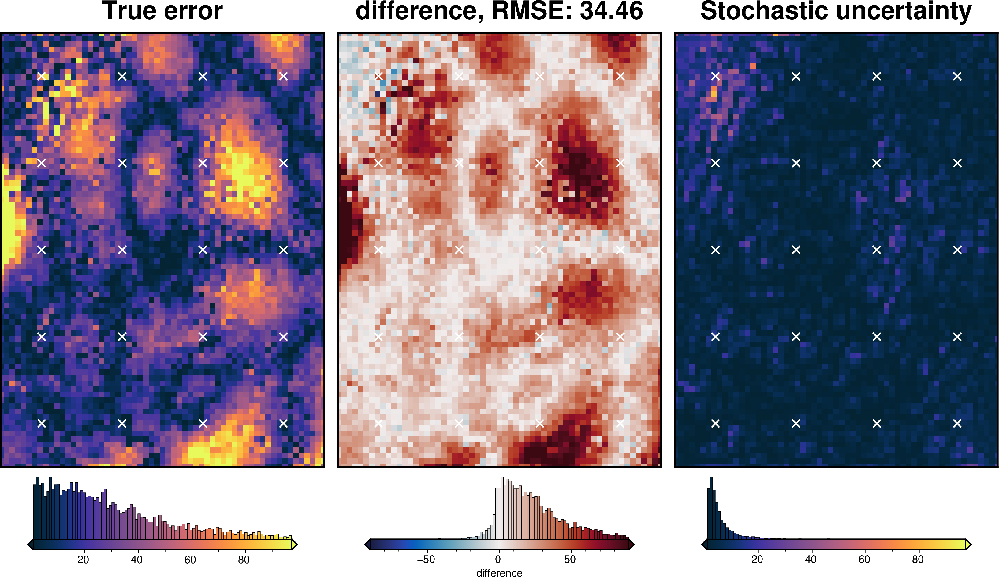

In [66]:
fname = "../../results/Ross_Sea_07_uncertainty_eq_sources"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_eq_sources_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=10,
    sample_gravity=True,
    **eqs_uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_eq_sources_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

## Total uncertainty

In [67]:
# make min gravity uncertainty 0.3 mGal
grav_df_eqs_uncert["uncert"] = np.maximum(grav_df_eqs_uncert.uncert, 0.3)

grav_df_eqs_uncert = regional.regional_separation(
    grav_df=grav_df_eqs_uncert,
    **new_regional_grav_kwargs,
)

# kwargs to reuse for all uncertainty analyses
uncert_kwargs = dict(
    grav_df=grav_df_eqs_uncert,
    density_contrast=best_density_contrast,
    zref=zref,
    starting_prisms=starting_prisms,
    starting_topography=starting_bathymetry,
    regional_grav_kwargs=new_regional_grav_kwargs,
    **kwargs,
)

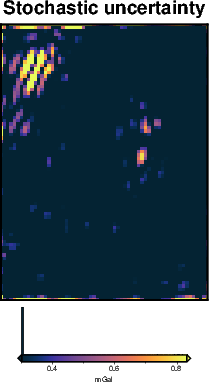

In [68]:
grav_grid = grav_df_eqs_uncert.set_index(["northing", "easting"]).to_xarray()

maps.plot_grd(
    grav_grid.uncert,
    region=inversion_region,
    fig_height=10,
    title="Stochastic uncertainty",
    cmap="thermal",
    hist=True,
    robust=True,
    cbar_label="mGal",
)

INFO:invert4geom:Sampled 'solver_damping' parameter values; mean: 0.02778446075596592, min: 0.008978739959152372, max: 0.06727848861568876
INFO:invert4geom:Sampled 'density_contrast' parameter values; mean: 1590.3559403649456, min: 1393.4159939602914, max: 1787.2958867696
INFO:invert4geom:Sampled 'depth' parameter values; mean: 106357.34134463652, min: -310555.77570920426, max: 523270.45839847747
INFO:invert4geom:Sampled 'damping' parameter values; mean: 0.03055025244967633, min: 5.83533695133644e-22, max: 0.6099872345267319
INFO:invert4geom:No pickle files starting with '../../results/Ross_Sea_07_uncertainty_full' found, creating new files



stochastic ensemble:   0%|          | 0/20 [00:00<?, ?it/s]

INFO:invert4geom:starting stochastic uncertainty analysis at run 0 of 20
saving results to pickle files with prefix: '../../results/Ross_Sea_07_uncertainty_full'



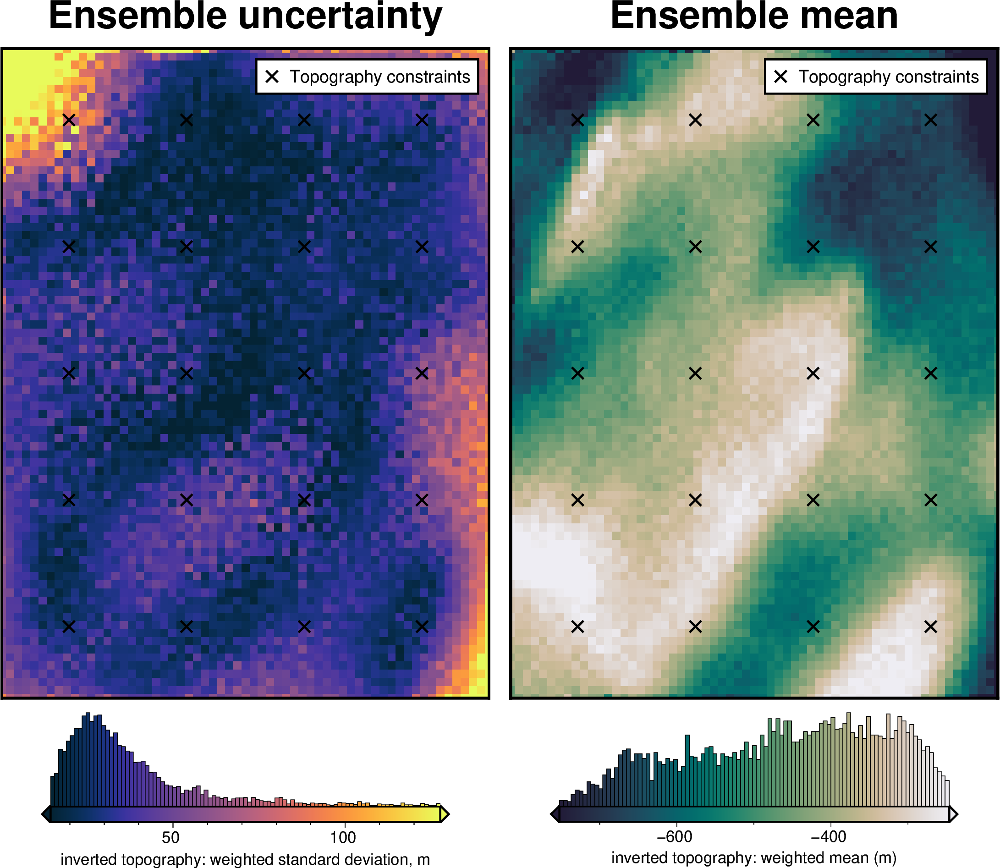

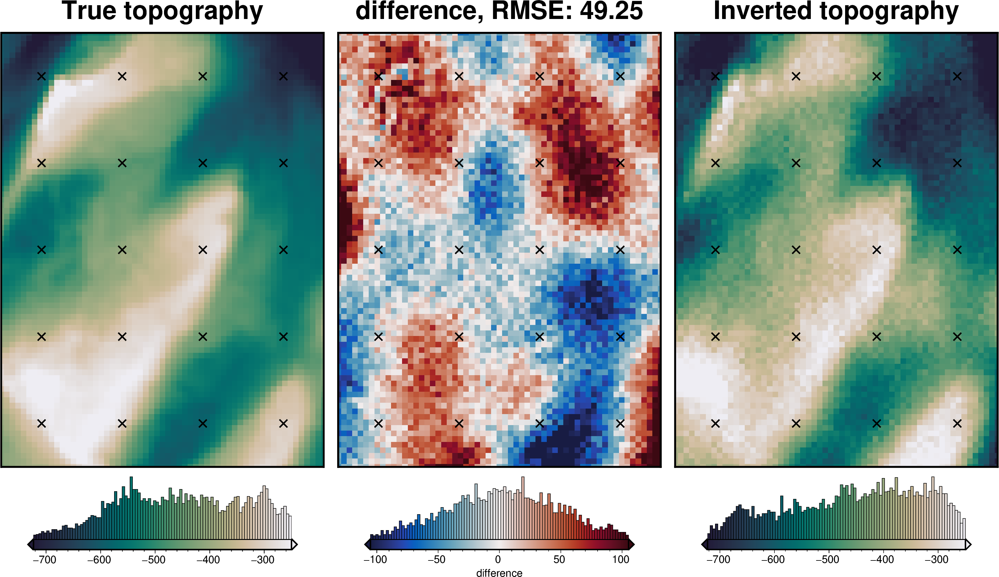

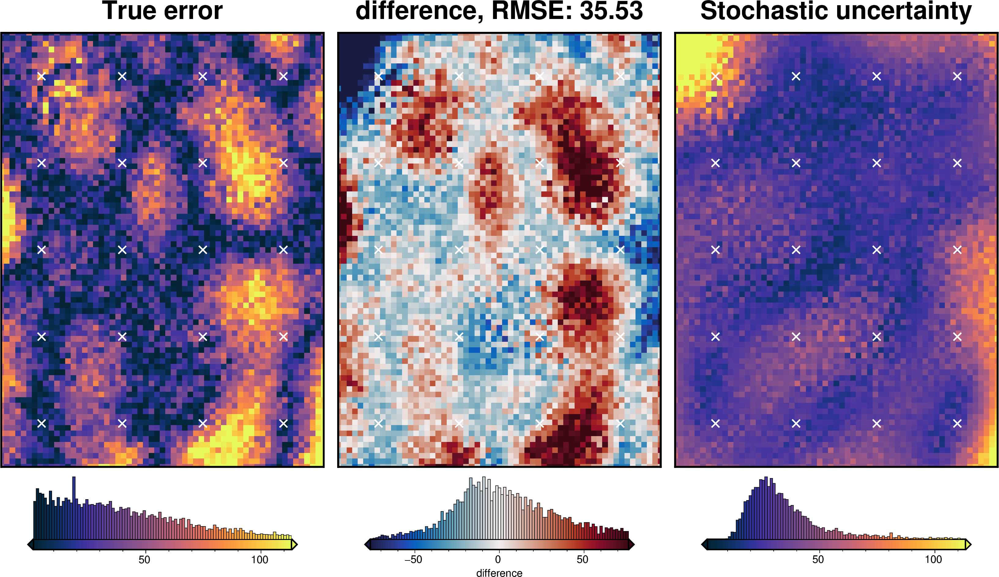

In [69]:
fname = "../../results/Ross_Sea_07_uncertainty_full"

# delete files if already exist
for p in pathlib.Path().glob(f"{fname}*"):
    p.unlink(missing_ok=True)

uncert_results = uncertainty.full_workflow_uncertainty_loop(
    fname=fname,
    runs=20,
    sample_gravity=True,
    sample_constraints=True,
    constraints_df=constraint_points,
    parameter_dict=solver_dict | density_dict,
    regional_misfit_parameter_dict=regional_misfit_parameter_dict,
    starting_topography_kwargs=starting_topography_kwargs,
    **uncert_kwargs,
)

stats_ds = RIS_plotting.uncert_plots(
    uncert_results,
    inversion_region,
    spacing,
    bathymetry,
    constraint_points=constraint_points,
    weight_by="constraints",
    # weight_by="residual",
    # weight_by=None,
)

### Comparing results

In [70]:
results = [
    uncert_results,
    uncert_eq_sources_results,
    uncert_regional_results,
    uncert_grav_results,
    uncert_constraints_results,
    uncert_density_results,
    uncert_damping_results,
]
names = [
    "full",
    "eq_sources",
    "regional",
    "grav",
    "constraints",
    "density",
    "damping",
]

# get cell-wise stats for each ensemble
stats = []
for r in results:
    ds = uncertainty.merged_stats(
        results=r,
        plot=False,
        constraints_df=constraint_points,
        weight_by="constraints",
        region=vd.pad_region(inversion_region, -spacing),
    )
    stats.append(ds)

In [71]:
# get the standard deviation of the ensemble of ensembles
stdevs = []
for i, s in enumerate(stats):
    stdevs.append(s.weighted_stdev.rename(f"{names[i]}_stdev"))

merged = xr.merge(stdevs)
merged

<xarray.Dataset> Size: 262kB
Dimensions:            (northing: 79, easting: 59)
Coordinates:
  * northing           (northing) float64 632B -1.795e+06 ... -1.405e+06
  * easting            (easting) float64 472B -3.5e+04 -3e+04 ... 2.55e+05
Data variables:
    full_stdev         (northing, easting) float64 37kB 55.74 50.56 ... 86.65
    eq_sources_stdev   (northing, easting) float64 37kB 5.532 2.416 ... 2.667
    regional_stdev     (northing, easting) float64 37kB 92.63 83.79 ... 60.56
    grav_stdev         (northing, easting) float64 37kB 7.519 6.284 ... 10.09
    constraints_stdev  (northing, easting) float64 37kB 17.42 16.87 ... 38.81
    density_stdev      (northing, easting) float64 37kB 6.7 5.923 ... 13.32
    damping_stdev      (northing, easting) float64 37kB 0.3446 ... 0.9997

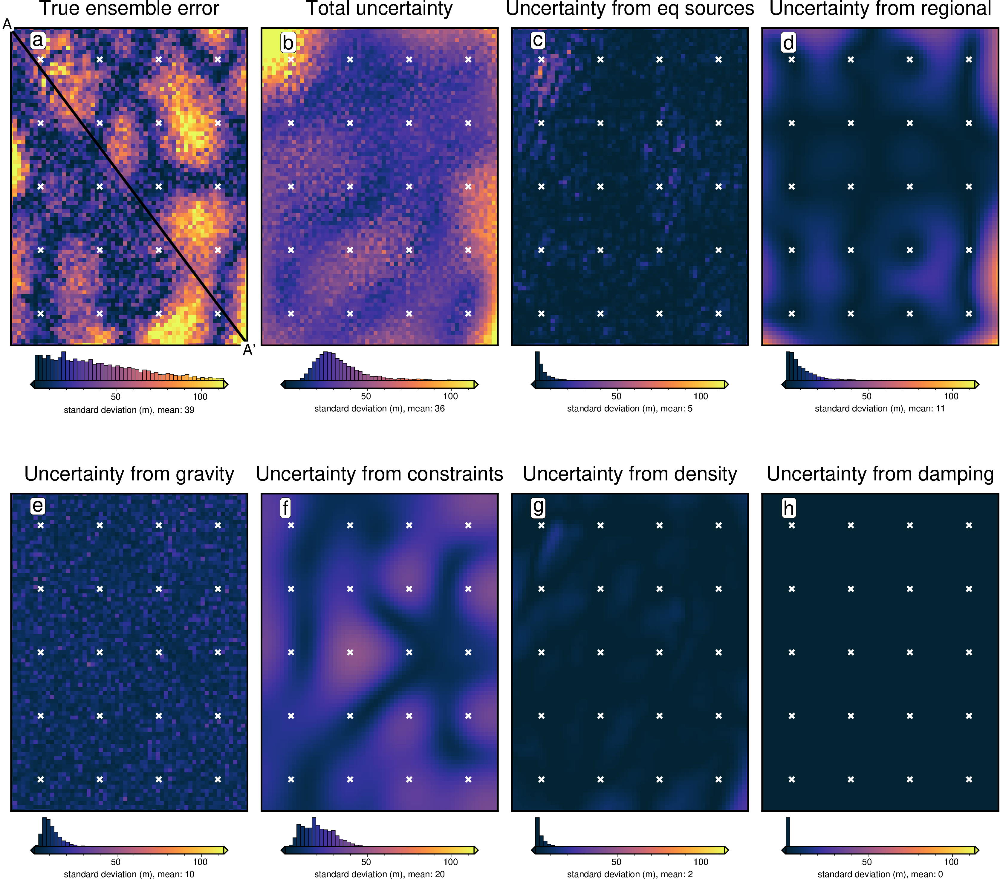

In [72]:
titles = [
    "True ensemble error",
    "Total uncertainty",
    "Uncertainty from eq sources",
    "Uncertainty from regional",
    "Uncertainty from gravity",
    "Uncertainty from constraints",
    "Uncertainty from density",
    "Uncertainty from damping",
]
grids = list(merged.data_vars.values())

grids.insert(0, np.abs(stats[0].weighted_mean - bathymetry))

cpt_lims = polar_utils.get_min_max(
    grids[0],
    robust=True,
)
# cpt_lims = polar_utils.get_combined_min_max(grids, robust=True)

fig_height = 9
for i, g in enumerate(grids):
    xshift_amount = 1
    if i == 0:
        fig = None
        origin_shift = "initialize"
    elif i == 4:
        origin_shift = "both_shift"
        xshift_amount = -3
    else:
        origin_shift = "xshift"

    fig = maps.plot_grd(
        grid=g,
        fig_height=fig_height,
        # region=vd.pad_region(inversion_region, -3*spacing),
        title=titles[i],
        title_font="16p,Helvetica,black",
        cmap="thermal",
        cpt_lims=cpt_lims,
        robust=True,
        cbar_label=f"standard deviation (m), mean: {int(np.nanmean(g))}",
        hist=True,
        hist_bin_num=50,
        cbar_yoffset=1,
        fig=fig,
        origin_shift=origin_shift,
        xshift_amount=xshift_amount,
        yshift_amount=-1.1,
    )
    fig.plot(
        x=constraint_points.easting,
        y=constraint_points.northing,
        style="x.2c",
        fill="white",
        pen="1.5p,white",
    )
    fig.text(
        position="TL",
        text=f"{string.ascii_lowercase[i]}",
        fill="white",
        pen=True,
        font="16p,Helvetica,black",
        offset="j.6/.2",
        clearance="+tO",
        no_clip=True,
    )
    if i == 0:
        # plot profiles location, and endpoints on map
        start = [inversion_region[0], inversion_region[3]]
        stop = [inversion_region[1], inversion_region[2]]
        fig.plot(
            vd.line_coordinates(start, stop, size=100),
            pen="2p,black",
        )
        fig.text(
            x=start[0],
            y=start[1],
            text="A",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
        fig.text(
            x=stop[0],
            y=stop[1],
            text="A' ",
            fill="white",
            font="12p,Helvetica,black",
            justify="CM",
            clearance="+tO",
            no_clip=True,
        )
fig.show()

grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).
grdtrack [WARNING]: Some input points were outside the grid domain(s).


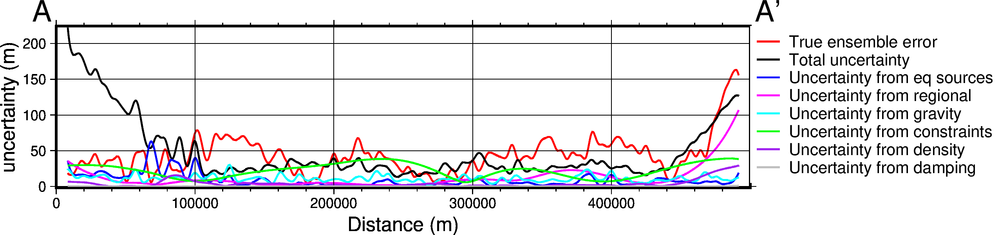

In [73]:
data_dict = profiles.make_data_dict(
    names=titles,
    grids=grids,
    colors=[
        "red",
        "black",
        "blue",
        "magenta",
        "cyan",
        "green",
        "purple",
        "gray",
    ],
)

fig, df_data = profiles.plot_data(
    "points",
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    num=10000,
    fig_height=4,
    fig_width=15,
    data_dict=data_dict,
    data_legend_loc="jTR+jTL",
    data_legend_box="+gwhite",
    data_buffer=0.01,
    data_frame=["neSW", "xafg+lDistance (m)", "yag+luncertainty (m)"],
    # data_pen_style=[None,None,"4_2:2p"],
    # data_pen_thickness=[1, 1.5, 1],
    share_yaxis=True,
    start_label="A",
    end_label="A' ",
)
fig.show()

In [74]:
# save results
merged.to_netcdf("../../results/Ross_Sea_07_sensitivity.nc")

In [75]:
stats_ds.to_netcdf("../../results/Ross_Sea_07_uncertainty.nc")